# **Introduction**

**About Dataset**

* **Breast cancer** is one of the **most common** causes of death among **women worldwide**. Early detection helps in reducing the **number of early deaths**. The data reviews the **medical images of breast cancer** using ultrasound scan. **Breast Ultrasound Dataset** is categorized into **three classes** $:$ **normal, benign, and malignant images**. **Breast ultrasound images** can produce great results in **classification, detection, and segmentation** of breast cancer when combined with machine learning. 

* The data collected at baseline include **breast ultrasound images among women** in ages between 25 and 75 years old. This data was collected in **2018**. The number of patients is **600 female patients**. The dataset consists of **780 images** with an **average image size of 500*500 pixels**. The images are in PNG format. The ground truth images are presented with original images. The images are categorized into **three classes, which are normal, benign, and malignant**.

**Approach**

* **AttentionUNet/UNet** is the best know model for **Multi-Class Segmentation**, thats why we will be creating a **Attention UNet Model**.
* As the **image Dataset** is **old**, please **do not use it for any new medical operations**.
* All the images are of 500 X 500 pixels, **Kaggle RAM** wil not be enough so we will be resizing the Image to **256 X 256 pixels**.

**Model Architecture**

* The Model will consist of a **Encoder Block, Decoder Block and a Attention Gate.**

# **Imports**

from IPython.display import clear_output
!pip install tf_explain
clear_output()

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')
# root_path = '/content/drive/MyDrive/Dataset_BUSI_with_GT/'

root_path = '/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/'

# root_path = './Dataset_BUSI_with_GT/'

In [2]:
! pip install tf_explain
! pip install segmentation-models

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.6 MB/s eta 0:00:00


In [3]:
import tensorflow as tf
tf.__version__

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

'2.12.0'

In [4]:
# common
import os
#import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tqdm

# Data
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

# Data Viz
import matplotlib.pyplot as plt

# Model 
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import UpSampling2D
from tensorflow.keras.layers import UpSampling2D
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import Add
from tensorflow.keras.layers import Multiply
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import MaxPool2D
from tensorflow.keras.layers import BatchNormalization

# Callbacks 
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint

# Grad CAM
from tf_explain.core.grad_cam import GradCAM

# Metrics
from tensorflow.keras.metrics import MeanIoU

# pre-trained models
%env SM_FRAMEWORK=tf.keras
import segmentation_models as sm

env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


# **Data**

## Utility functions

Data loading

In [5]:
from tensorflow.keras.utils import load_img, img_to_array


def load_image(image, SIZE):
    # Load the image 
    img = load_img(image)    # Returns PIL Image with dimension: (height, width, channels)
    # Resize the array
    img = tf.image.resize(img, [SIZE, SIZE])
    return np.round(img_to_array(img)/255, 4)


def load_images(image_paths, SIZE, trim=None):
    '''
    Version 2: Valid when we are dealing with more that 2 classes.

    input: path to folder containing images and masks
    returns: np.array of images with dimension: (num_images, height, width, channels=3) 
    '''
    if trim is not None:
        image_paths = image_paths[:trim]

    images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3), dtype=np.float32)

    for i,image in enumerate(image_paths):
        print(f"\rLoading {i+1} of {len(image_paths)} images".ljust(70), end = '')
        images[i] = load_image(image,SIZE)
    print(f"\rLoaded {len(image_paths)} images".ljust(70))

    return images


def merge_masks(mask_1, mask_2):
    """Merge 2 masks into one"""
    if mask_1.shape != mask_2.shape:
        raise ValueError("the 2 masks must have the same shape")
    merged_mask = np.zeros(mask_1.shape, dtype=mask_1.dtype)
    np.logical_or(mask_1, mask_2, out=merged_mask)
    return merged_mask


def path_number(path):
    return int(path.split(' ')[1].split(')')[0].split('(')[-1])

def path_class(path):
    path = path.replace('\\', '/') # if used on windows
    return path.split('/')[-1].split(' ')[0]


def load_masks(mask_paths, duplicate_paths, triplicate_paths, SIZE=256, mask=False, trim=None):
    '''
    Version 2: Valid when we are dealing with more that 2 classes.

    input: path to folder containing images and masks
    returns: np.array of images with dimension: (num_images, height, width, channel=3) 
    '''
    if trim is not None:
        mask_paths = mask_paths[:trim]

    masks = np.zeros(shape=(len(mask_paths), SIZE, SIZE, 3), dtype=np.uint8) # Last dimension is for the class of each pixel
    masks[:,:,:,2] = 1 # all the zones are by default no tumor, so the value of the last channel is 1

    for i, path in enumerate(mask_paths):
        print(f"\rLoading {i+1} of {len(mask_paths)} masks".ljust(70), end = '')
        img = load_image(path, SIZE)
        for duplicate_path in duplicate_paths:
            if path_number(path) != path_number(duplicate_path):
                continue
            if path_class(path) != path_class(duplicate_path):
                continue
            img2 = load_image(duplicate_path, SIZE)

            img = merge_masks(img, img2)

        if mask:
            # Adding 3 new lines ....
            label2index = {'benign': 0, 'malignant': 1, 'normal': 2}
            class_label = path.replace('\\', '/').split('/')[-2]
            class_index = label2index[class_label]
            if class_index < 2:
                # if there is a tumor, set the corresponding zone in its channel to 1
                # and the corresponding zone in the normal channel to 0
                masks[i,:,:,class_index] = img[:,:,0]
                masks[i,:,:,2] = 1-img[:,:,0]
    print(f"\rLoaded {len(mask_paths)} masks".ljust(70))

    return masks

Vizualization

In [6]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

## Preprocessing demo

In [7]:
SIZE = 256

In [8]:
classes = ['benign', 'malignant', 'normal']
classes

['benign', 'malignant', 'normal']

In [9]:
first_mask_paths = sorted([sorted(glob(root_path + name + "/*mask.png")) for name in classes])
second_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_1.png")) for name in classes])
third_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_2.png")) for name in classes])

def flatten_list(to_flatten):
    return [element for l1 in to_flatten for element in l1]

first_mask_paths = flatten_list(first_mask_paths)
second_mask_paths = flatten_list(second_mask_paths)
third_mask_paths = flatten_list(third_mask_paths)

image_paths = [p.replace('_mask', '') for p in first_mask_paths]

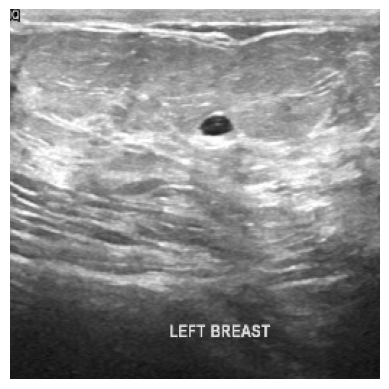

In [10]:
show_image(load_image(image_paths[0], SIZE))

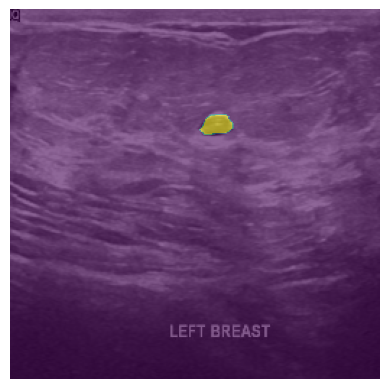

In [11]:
show_mask(load_image(image_paths[0], SIZE), load_image(first_mask_paths[0], SIZE)[:,:,0], alpha=0.6)

## Merge masks for the same image

Some images have multiple tumors, hence multiple masks. Here is an example:

In [12]:
img = load_image(os.path.join(root_path, 'benign/benign (100).png'), SIZE)
mask1 = load_image(os.path.join(root_path, 'benign/benign (100)_mask_1.png'), SIZE)
mask2 = load_image(os.path.join(root_path, 'benign/benign (100)_mask.png'), SIZE)

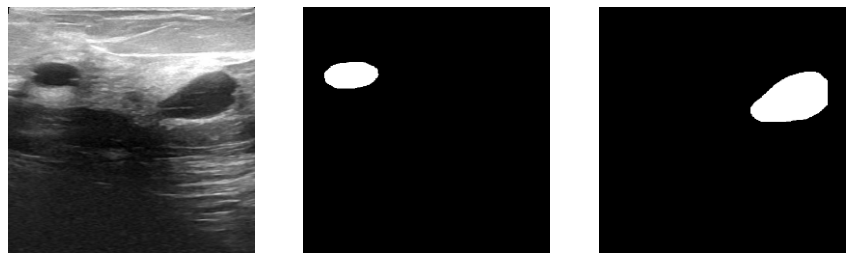

In [13]:
w, h, dpi = 360*3, 360, 78
fig, axs = plt.subplots(ncols=3, figsize=(w/dpi, h/dpi), dpi=dpi)

axs[0].imshow(img)
axs[1].imshow(mask1)
axs[2].imshow(mask2)

for ax in axs:
    ax.set_axis_off()
plt.show()

The approach used here is to just merge the 2 masks into one, by taking the logical or between the two masks, as defined above in `merge_masks`.

The result on the previous images then looks like this:

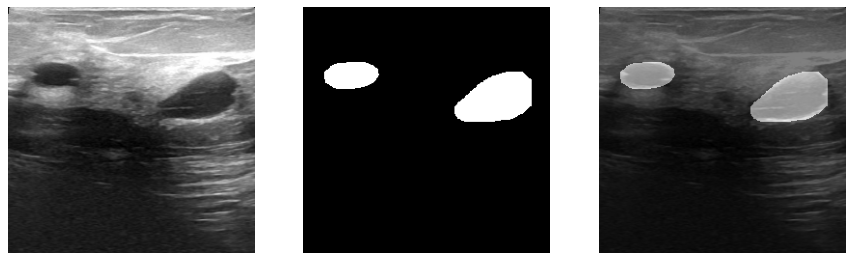

In [14]:
merged_mask = merge_masks(mask1, mask2)

w, h, dpi = 360*3, 360, 78
fig, axs = plt.subplots(ncols=3, figsize=(w/dpi, h/dpi), dpi=dpi)

axs[0].imshow(img)
axs[1].imshow(merged_mask)
axs[2].imshow(img)
axs[2].imshow(merged_mask, alpha=0.5)

for ax in axs:
    ax.set_axis_off()
plt.show()

## Train-val-test split

In [15]:
images = load_images(image_paths, SIZE)

Loaded 780 images                                                    


In [16]:
masks = load_masks(first_mask_paths, second_mask_paths, SIZE, mask=True)

Loaded 780 masks                                                     


In [17]:
label2index = {'benign': 0, 'malignant': 1, 'normal': 2}
labels = [label2index[path_class(path)] for path in image_paths]

In [18]:
from sklearn.model_selection import train_test_split

images_train, images_test, masks_train, masks_test, labels_train, labels_test = train_test_split(images, masks, labels, test_size=0.15, random_state=42, stratify=labels)
images_train, images_val, masks_train, masks_val, labels_train, labels_val = train_test_split(images_train, masks_train, labels_train, test_size=0.15, random_state=42, stratify=labels_train)

In [19]:
images_train.shape, images_val.shape, images_test.shape

((563, 256, 256, 3), (100, 256, 256, 3), (117, 256, 256, 3))

## Custom Callback

In [20]:
# Luminance-preserving RGB matrix
# inverts R and G so that malignant tumors appear red and benign green
LRGB = np.array([[0.299,  0.587,  0.114],
                 [0.500, -0.419, -0.081],
                 [-0.168, -0.331,  0.500]])

class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(len(images_val))

        image = images_val[id].copy()
        mask = masks_val[id].copy()
        predicted_mask = self.model.predict(image[np.newaxis,...])[0]

        # exp = GradCAM()
        # cam = exp.explain(
        #     validation_data=(image[np.newaxis,...], mask),
        #     class_index=1,
        #     layer_name='Attention4',
        #     model=self.model
        # )

        # adjust brightness of mask and hide the blue channel
        # mask[:,:,2] = 0
        # predicted_mask[:,:,2] = 0
        mask = np.einsum("cd, ijc->ijd", LRGB, mask).clip(0, 1)
        predicted_mask = np.einsum("cd, ijc->ijd", LRGB, predicted_mask).clip(0, 1)

        w, h, dpi = 2*360, 360, 72
        fig, axs = plt.subplots(ncols=2, figsize=(w/dpi, h/dpi), dpi=dpi)

        alpha=0.5
        for ax in axs:
            ax.imshow(image)

        axs[0].imshow(mask, alpha=alpha)
        axs[0].set_title("Original Mask")

        axs[1].imshow(predicted_mask, alpha=alpha)
        axs[1].set_title("Predicted Mask")

        # axs[2].imshow(cam, alpha=alpha)
        # axs[2].set_title("GradCAM")

        plt.tight_layout()
        plt.show()

In [21]:
## Custom 
num_class_labels = 3

## Pre-trained Unet

In [22]:
model = sm.Unet(backbone_name='resnet34',
                encoder_weights='imagenet',
                classes=3,
                encoder_freeze=True,
                activation='softmax')

85521592/85521592 [==============================] - 0s 0us/step


## Compile

In [23]:
# find class weights, equal to the inverse frequency of the pixel occurrences
# total_locations = np.prod(masks_train.shape[:-1])
# class_weights = total_locations/masks_train.sum(axis=(0,1,2))

# find class weights, equal to the inverse frequency of the class occurrences
class_weights = len(labels_train)/np.bincount(labels_train)

class_weights /= class_weights.max() # make maximum weight equal to 1

# Compile
model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=3, name='IoU')],
)

model.output

<KerasTensor: shape=(None, None, None, 3) dtype=float32 (created by layer 'softmax')>

# Training

Epoch 1/50
1/1 [==============================] - 1s 1s/step- loss: 0.3449 - accuracy: 0.9068 - IoU: 0.33


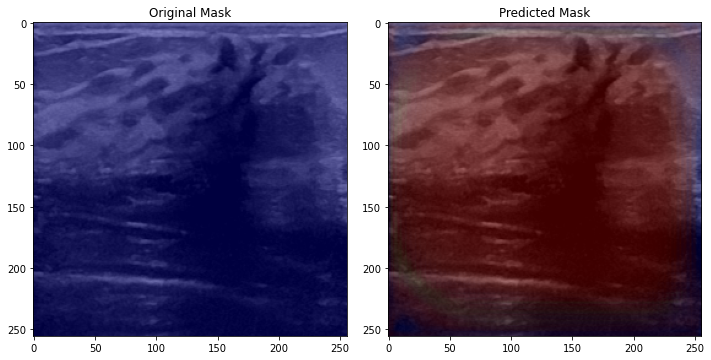

35/35 [==============================] - 40s 290ms/step - loss: 0.3449 - accuracy: 0.9068 - IoU: 0.3337 - val_loss: 3.5567 - val_accuracy: 0.1211 - val_IoU: 0.3337
Epoch 2/50
1/1 [==============================] - 0s 23ms/steploss: 0.1919 - accuracy: 0.9351 - IoU: 0.33


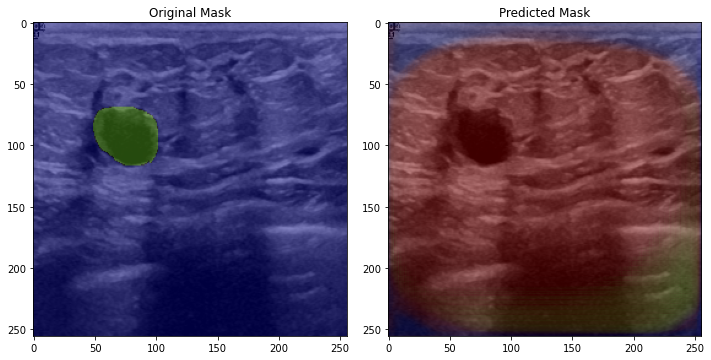

35/35 [==============================] - 7s 165ms/step - loss: 0.1919 - accuracy: 0.9351 - IoU: 0.3337 - val_loss: 12.2411 - val_accuracy: 0.1502 - val_IoU: 0.3337
Epoch 3/50
1/1 [==============================] - 0s 26ms/steploss: 0.1647 - accuracy: 0.9436 - IoU: 0.33


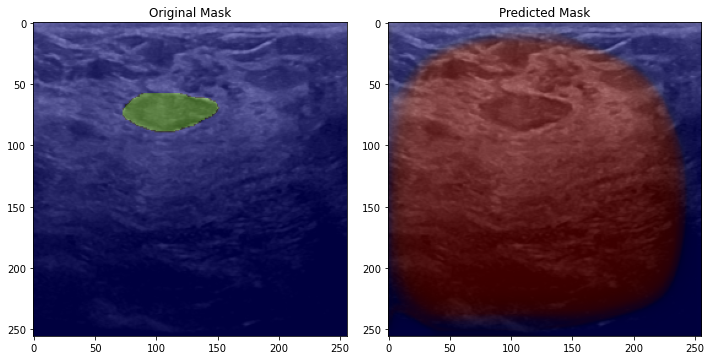

35/35 [==============================] - 6s 161ms/step - loss: 0.1647 - accuracy: 0.9436 - IoU: 0.3337 - val_loss: 3.9709 - val_accuracy: 0.3018 - val_IoU: 0.3337
Epoch 4/50
1/1 [==============================] - 0s 24ms/steploss: 0.1366 - accuracy: 0.9522 - IoU: 0.33


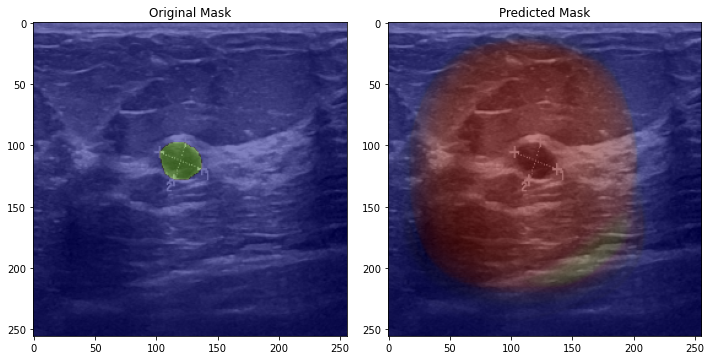

35/35 [==============================] - 7s 189ms/step - loss: 0.1366 - accuracy: 0.9522 - IoU: 0.3337 - val_loss: 1.2229 - val_accuracy: 0.5682 - val_IoU: 0.3337
Epoch 5/50
1/1 [==============================] - 0s 35ms/steploss: 0.1166 - accuracy: 0.9581 - IoU: 0.33


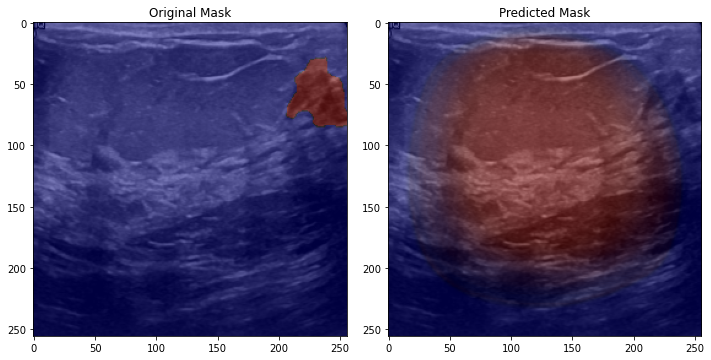

35/35 [==============================] - 7s 192ms/step - loss: 0.1166 - accuracy: 0.9581 - IoU: 0.3337 - val_loss: 1.1176 - val_accuracy: 0.5599 - val_IoU: 0.3337
Epoch 6/50
1/1 [==============================] - 0s 23ms/steploss: 0.1059 - accuracy: 0.9617 - IoU: 0.33


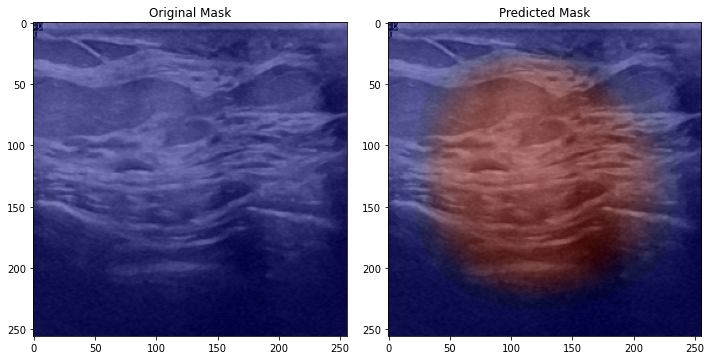

35/35 [==============================] - 6s 180ms/step - loss: 0.1059 - accuracy: 0.9617 - IoU: 0.3337 - val_loss: 1.0312 - val_accuracy: 0.6040 - val_IoU: 0.3337
Epoch 7/50
1/1 [==============================] - 0s 24ms/steploss: 0.1026 - accuracy: 0.9616 - IoU: 0.33


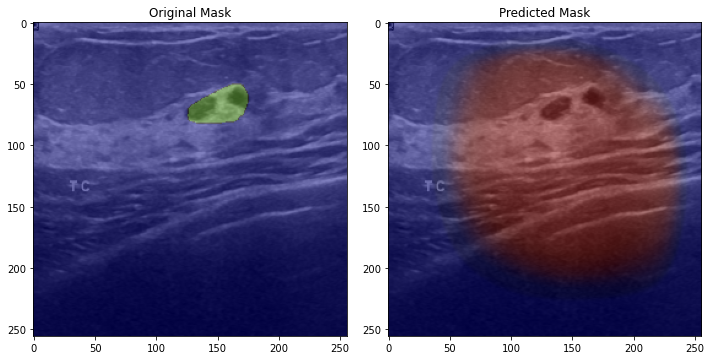

35/35 [==============================] - 6s 169ms/step - loss: 0.1026 - accuracy: 0.9616 - IoU: 0.3337 - val_loss: 1.1337 - val_accuracy: 0.6034 - val_IoU: 0.3337
Epoch 8/50
1/1 [==============================] - 0s 23ms/steploss: 0.0900 - accuracy: 0.9670 - IoU: 0.33


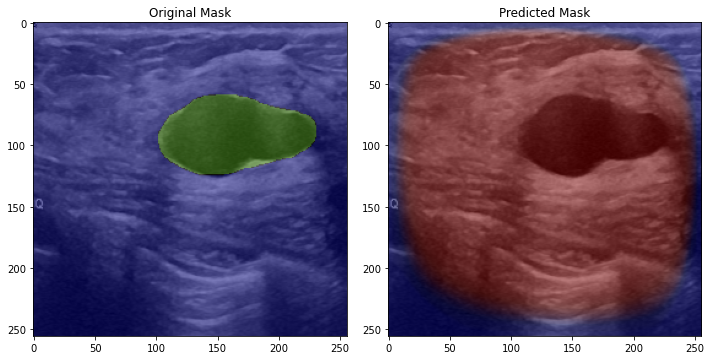

35/35 [==============================] - 6s 169ms/step - loss: 0.0900 - accuracy: 0.9670 - IoU: 0.3337 - val_loss: 4.5363 - val_accuracy: 0.2794 - val_IoU: 0.3337
Epoch 9/50
1/1 [==============================] - 0s 24ms/steploss: 0.0878 - accuracy: 0.9668 - IoU: 0.33


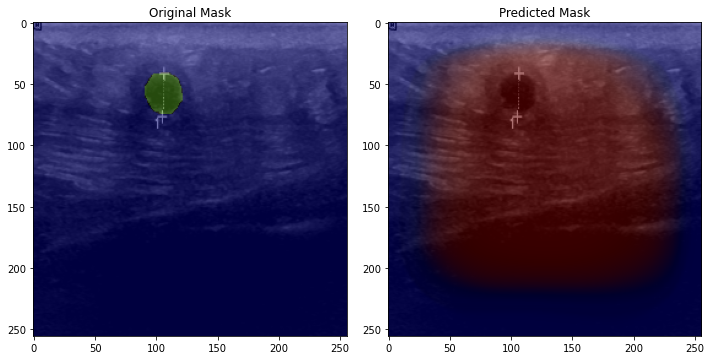

35/35 [==============================] - 6s 168ms/step - loss: 0.0878 - accuracy: 0.9668 - IoU: 0.3337 - val_loss: 1.1550 - val_accuracy: 0.5047 - val_IoU: 0.3337
Epoch 10/50
1/1 [==============================] - 0s 22ms/steploss: 0.0933 - accuracy: 0.9652 - IoU: 0.33


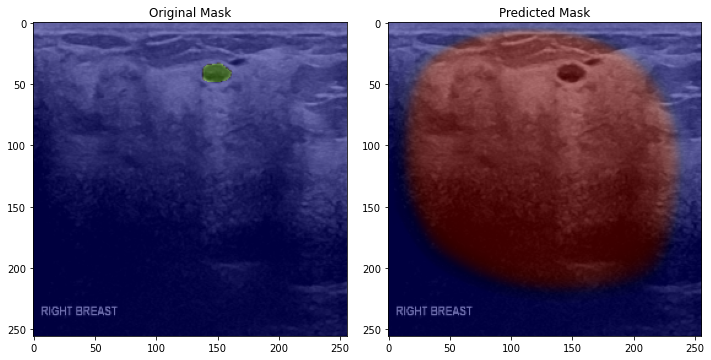

35/35 [==============================] - 6s 160ms/step - loss: 0.0933 - accuracy: 0.9652 - IoU: 0.3337 - val_loss: 2.9106 - val_accuracy: 0.4236 - val_IoU: 0.3337
Epoch 11/50
1/1 [==============================] - 0s 22ms/steploss: 0.0799 - accuracy: 0.9700 - IoU: 0.33


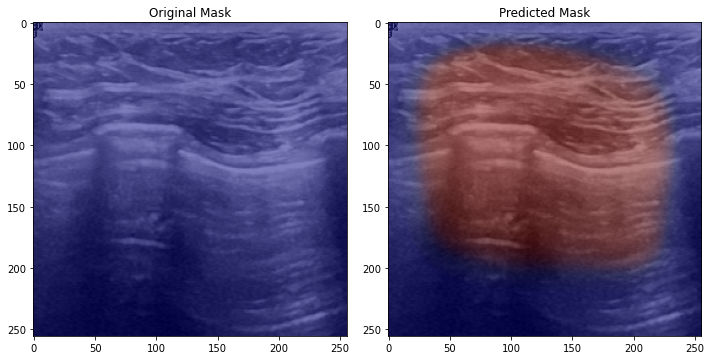

35/35 [==============================] - 6s 172ms/step - loss: 0.0799 - accuracy: 0.9700 - IoU: 0.3337 - val_loss: 1.2438 - val_accuracy: 0.5333 - val_IoU: 0.3337
Epoch 12/50
1/1 [==============================] - 0s 23ms/steploss: 0.0769 - accuracy: 0.9709 - IoU: 0.33


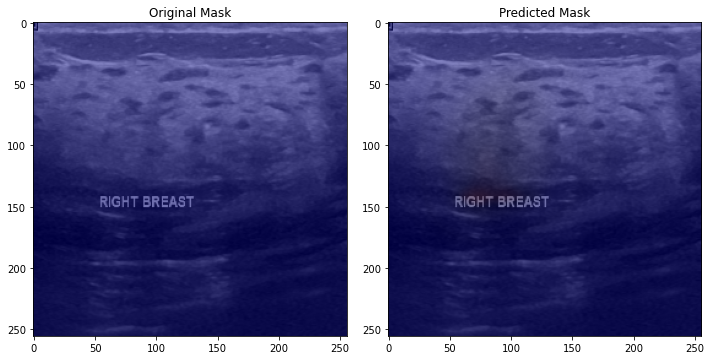

35/35 [==============================] - 6s 186ms/step - loss: 0.0769 - accuracy: 0.9709 - IoU: 0.3337 - val_loss: 0.3084 - val_accuracy: 0.9264 - val_IoU: 0.3337
Epoch 13/50
1/1 [==============================] - 0s 23ms/steploss: 0.0711 - accuracy: 0.9721 - IoU: 0.33


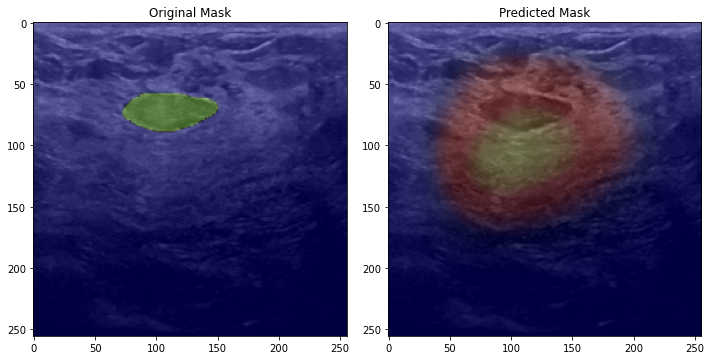

35/35 [==============================] - 6s 169ms/step - loss: 0.0711 - accuracy: 0.9721 - IoU: 0.3337 - val_loss: 0.4728 - val_accuracy: 0.8101 - val_IoU: 0.3337
Epoch 14/50
1/1 [==============================] - 0s 24ms/steploss: 0.0613 - accuracy: 0.9762 - IoU: 0.33


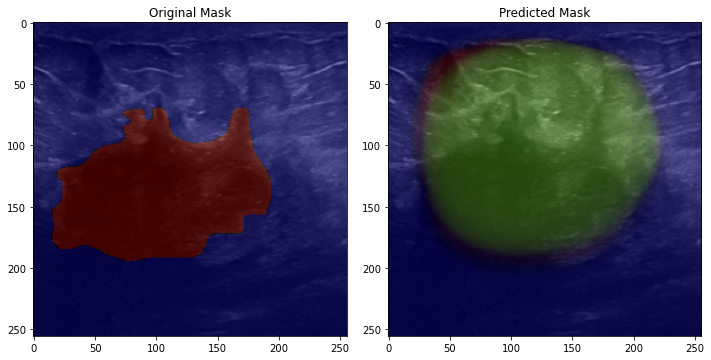

35/35 [==============================] - 6s 160ms/step - loss: 0.0613 - accuracy: 0.9762 - IoU: 0.3337 - val_loss: 1.7571 - val_accuracy: 0.5639 - val_IoU: 0.3337
Epoch 15/50
1/1 [==============================] - 0s 22ms/steploss: 0.0610 - accuracy: 0.9762 - IoU: 0.33


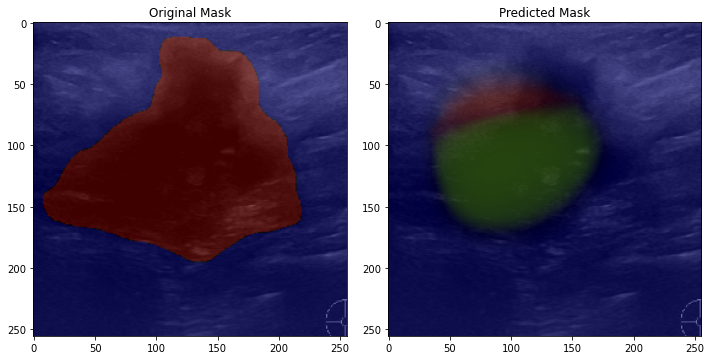

35/35 [==============================] - 6s 177ms/step - loss: 0.0610 - accuracy: 0.9762 - IoU: 0.3337 - val_loss: 1.5193 - val_accuracy: 0.6279 - val_IoU: 0.3337
Epoch 16/50
1/1 [==============================] - 0s 27ms/steploss: 0.0660 - accuracy: 0.9740 - IoU: 0.33


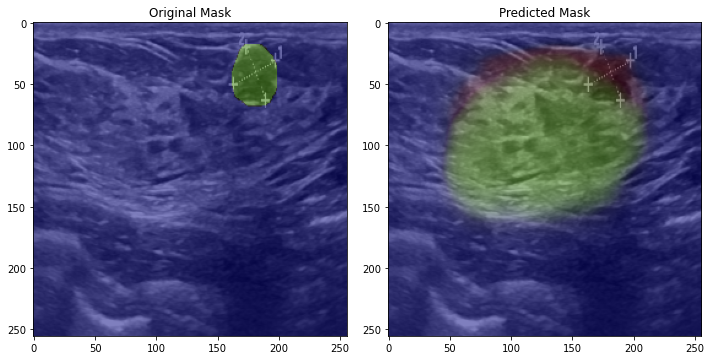

35/35 [==============================] - 6s 165ms/step - loss: 0.0660 - accuracy: 0.9740 - IoU: 0.3337 - val_loss: 0.6293 - val_accuracy: 0.7841 - val_IoU: 0.3337
Epoch 17/50
1/1 [==============================] - 0s 24ms/steploss: 0.0563 - accuracy: 0.9785 - IoU: 0.33


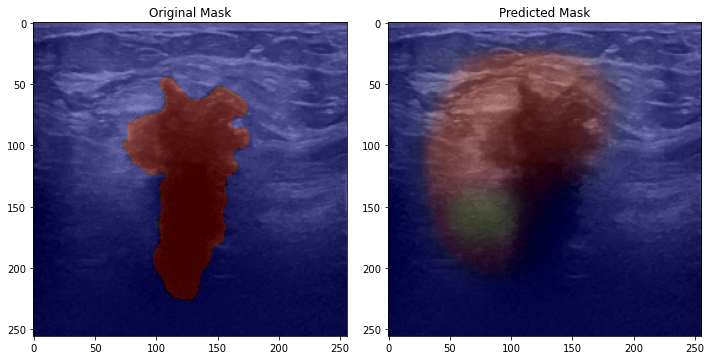

35/35 [==============================] - 6s 160ms/step - loss: 0.0563 - accuracy: 0.9785 - IoU: 0.3337 - val_loss: 0.7995 - val_accuracy: 0.7067 - val_IoU: 0.3337
Epoch 18/50
1/1 [==============================] - 0s 24ms/steploss: 0.0565 - accuracy: 0.9775 - IoU: 0.33


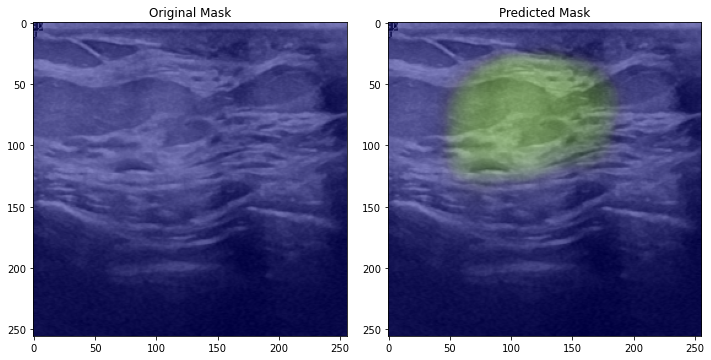

35/35 [==============================] - 6s 168ms/step - loss: 0.0565 - accuracy: 0.9775 - IoU: 0.3337 - val_loss: 0.5854 - val_accuracy: 0.8153 - val_IoU: 0.3337
Epoch 19/50
1/1 [==============================] - 0s 24ms/steploss: 0.0477 - accuracy: 0.9805 - IoU: 0.33


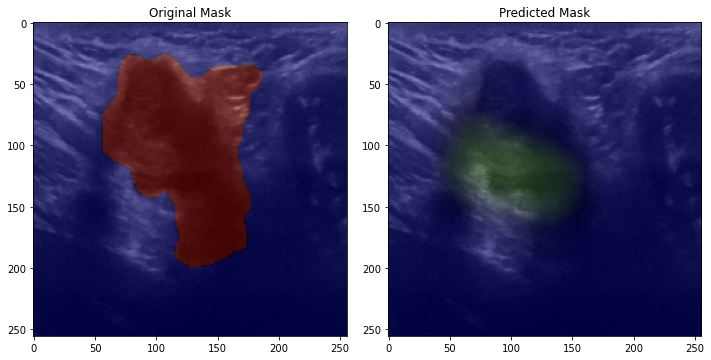

35/35 [==============================] - 6s 160ms/step - loss: 0.0477 - accuracy: 0.9805 - IoU: 0.3337 - val_loss: 0.5182 - val_accuracy: 0.8328 - val_IoU: 0.3337
Epoch 20/50
1/1 [==============================] - 0s 23ms/steploss: 0.0569 - accuracy: 0.9777 - IoU: 0.33


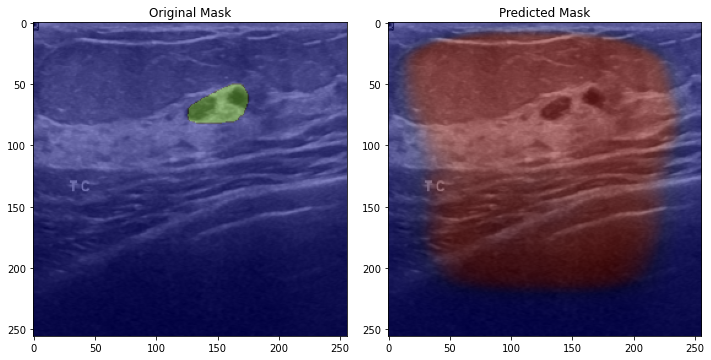

35/35 [==============================] - 6s 168ms/step - loss: 0.0569 - accuracy: 0.9777 - IoU: 0.3337 - val_loss: 2.1176 - val_accuracy: 0.4494 - val_IoU: 0.3337
Epoch 21/50
1/1 [==============================] - 0s 34ms/steploss: 0.0587 - accuracy: 0.9769 - IoU: 0.33


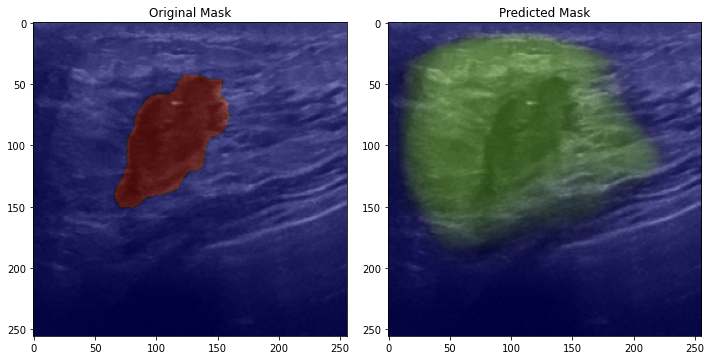

35/35 [==============================] - 6s 172ms/step - loss: 0.0587 - accuracy: 0.9769 - IoU: 0.3337 - val_loss: 0.8525 - val_accuracy: 0.6797 - val_IoU: 0.3337
Epoch 22/50
1/1 [==============================] - 0s 22ms/steploss: 0.0463 - accuracy: 0.9810 - IoU: 0.33


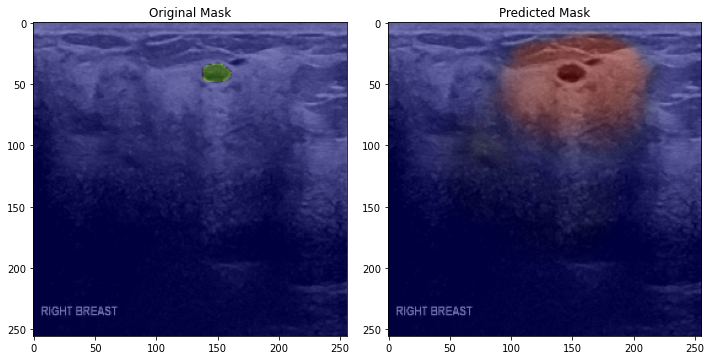

35/35 [==============================] - 6s 159ms/step - loss: 0.0463 - accuracy: 0.9810 - IoU: 0.3337 - val_loss: 0.5561 - val_accuracy: 0.7806 - val_IoU: 0.3337
Epoch 23/50
1/1 [==============================] - 0s 23ms/steploss: 0.0576 - accuracy: 0.9779 - IoU: 0.33


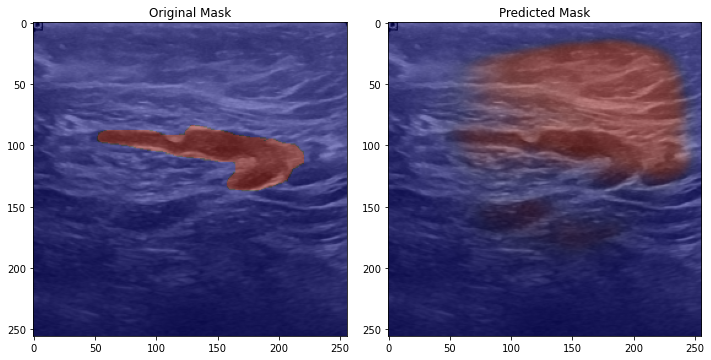

35/35 [==============================] - 6s 160ms/step - loss: 0.0576 - accuracy: 0.9779 - IoU: 0.3337 - val_loss: 1.2698 - val_accuracy: 0.6338 - val_IoU: 0.3337
Epoch 24/50
1/1 [==============================] - 0s 22ms/steploss: 0.0573 - accuracy: 0.9781 - IoU: 0.33


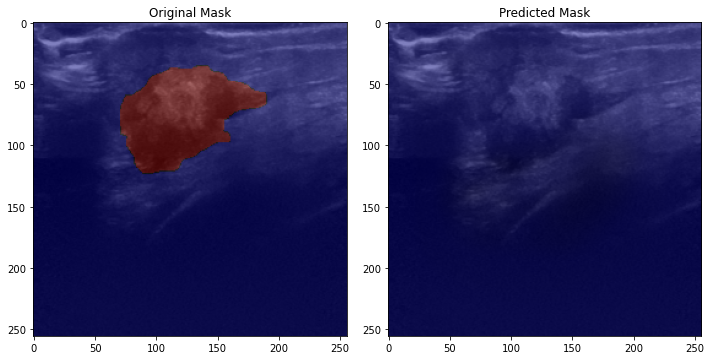

35/35 [==============================] - 6s 168ms/step - loss: 0.0573 - accuracy: 0.9781 - IoU: 0.3337 - val_loss: 0.4265 - val_accuracy: 0.9022 - val_IoU: 0.3337
Epoch 25/50
1/1 [==============================] - 0s 22ms/steploss: 0.0545 - accuracy: 0.9781 - IoU: 0.33


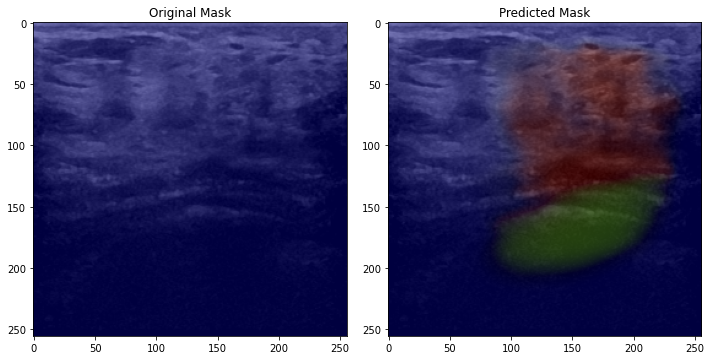

35/35 [==============================] - 6s 160ms/step - loss: 0.0545 - accuracy: 0.9781 - IoU: 0.3337 - val_loss: 0.7796 - val_accuracy: 0.7196 - val_IoU: 0.3337
Epoch 26/50
1/1 [==============================] - 0s 23ms/steploss: 0.0568 - accuracy: 0.9781 - IoU: 0.33


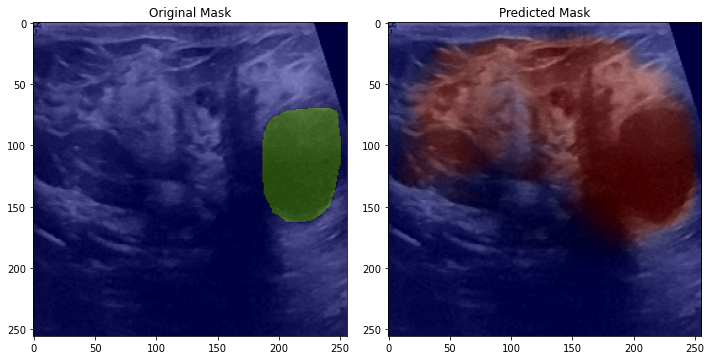

35/35 [==============================] - 6s 169ms/step - loss: 0.0568 - accuracy: 0.9781 - IoU: 0.3337 - val_loss: 0.4631 - val_accuracy: 0.8404 - val_IoU: 0.3337
Epoch 27/50
1/1 [==============================] - 0s 23ms/steploss: 0.0452 - accuracy: 0.9817 - IoU: 0.33


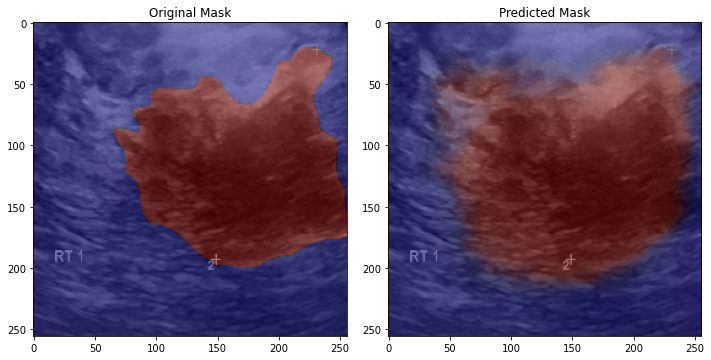

35/35 [==============================] - 6s 170ms/step - loss: 0.0452 - accuracy: 0.9817 - IoU: 0.3337 - val_loss: 1.0966 - val_accuracy: 0.6744 - val_IoU: 0.3337
Epoch 28/50
1/1 [==============================] - 0s 23ms/steploss: 0.0472 - accuracy: 0.9807 - IoU: 0.33


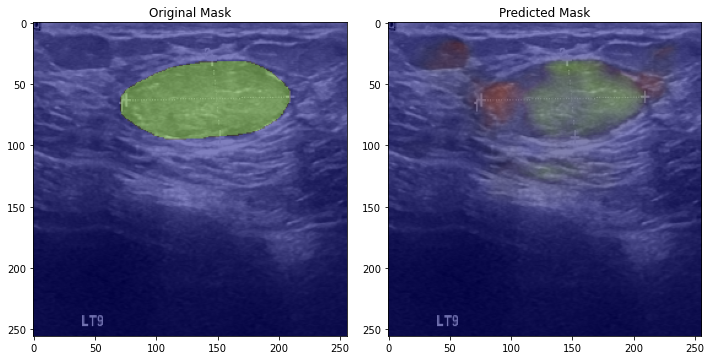

35/35 [==============================] - 6s 168ms/step - loss: 0.0472 - accuracy: 0.9807 - IoU: 0.3337 - val_loss: 0.7673 - val_accuracy: 0.7505 - val_IoU: 0.3337
Epoch 29/50
1/1 [==============================] - 0s 24ms/steploss: 0.0501 - accuracy: 0.9803 - IoU: 0.33


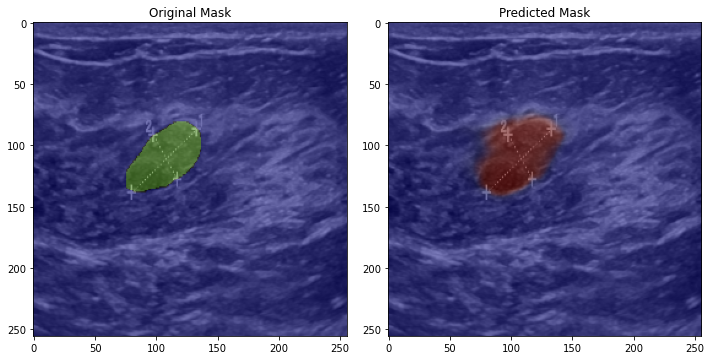

35/35 [==============================] - 6s 179ms/step - loss: 0.0501 - accuracy: 0.9803 - IoU: 0.3337 - val_loss: 0.2360 - val_accuracy: 0.9331 - val_IoU: 0.3337
Epoch 30/50
1/1 [==============================] - 0s 22ms/steploss: 0.0408 - accuracy: 0.9835 - IoU: 0.33


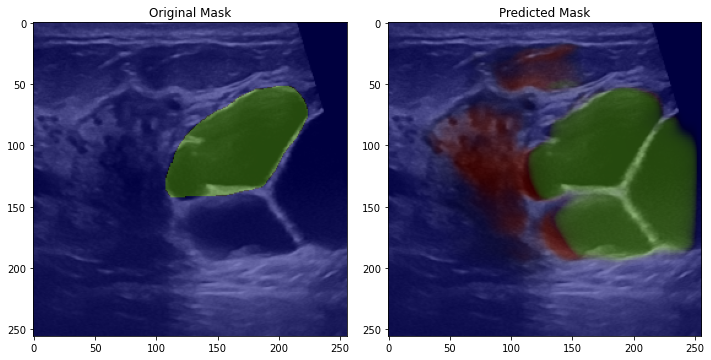

35/35 [==============================] - 6s 162ms/step - loss: 0.0408 - accuracy: 0.9835 - IoU: 0.3337 - val_loss: 0.2947 - val_accuracy: 0.8964 - val_IoU: 0.3337
Epoch 31/50
1/1 [==============================] - 0s 26ms/steploss: 0.0444 - accuracy: 0.9822 - IoU: 0.33


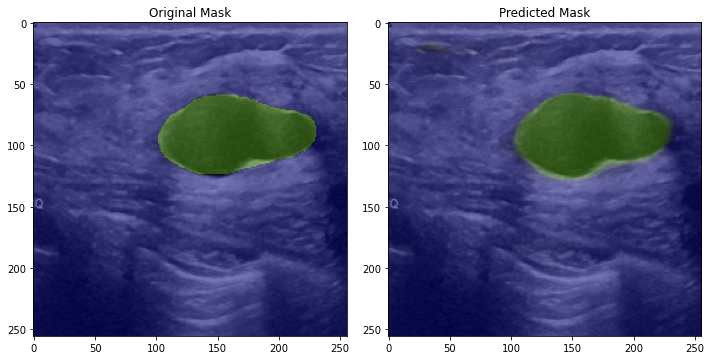

35/35 [==============================] - 7s 189ms/step - loss: 0.0444 - accuracy: 0.9822 - IoU: 0.3337 - val_loss: 0.2304 - val_accuracy: 0.9395 - val_IoU: 0.3337
Epoch 32/50
1/1 [==============================] - 0s 24ms/steploss: 0.0420 - accuracy: 0.9836 - IoU: 0.33


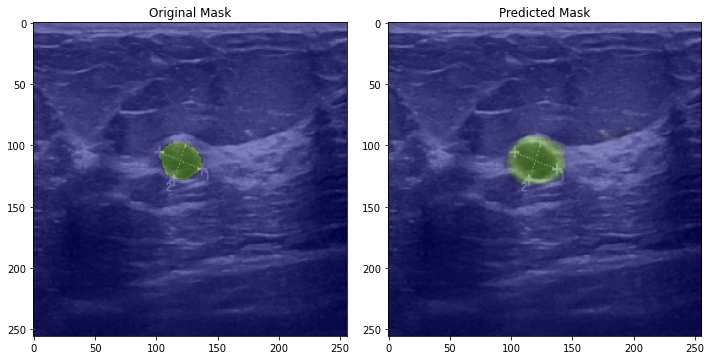

35/35 [==============================] - 6s 181ms/step - loss: 0.0420 - accuracy: 0.9836 - IoU: 0.3337 - val_loss: 0.2200 - val_accuracy: 0.9446 - val_IoU: 0.3337
Epoch 33/50
1/1 [==============================] - 0s 23ms/steploss: 0.0382 - accuracy: 0.9846 - IoU: 0.33


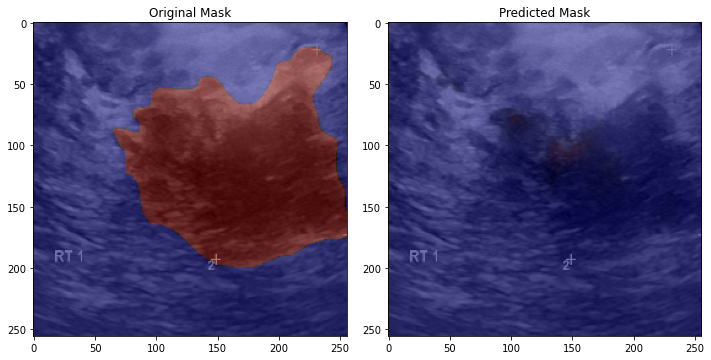

35/35 [==============================] - 6s 168ms/step - loss: 0.0382 - accuracy: 0.9846 - IoU: 0.3337 - val_loss: 0.2358 - val_accuracy: 0.9440 - val_IoU: 0.3337
Epoch 34/50
1/1 [==============================] - 0s 22ms/steploss: 0.0332 - accuracy: 0.9865 - IoU: 0.33


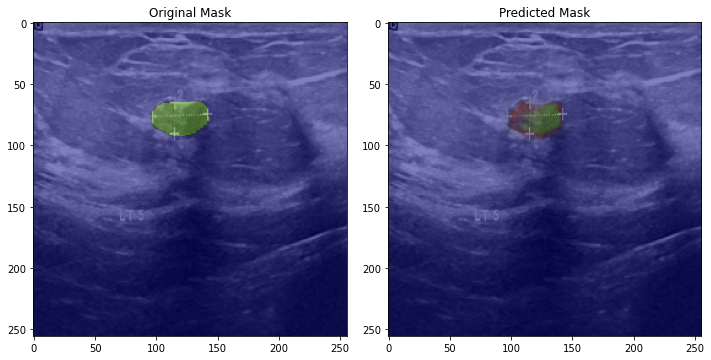

35/35 [==============================] - 6s 186ms/step - loss: 0.0332 - accuracy: 0.9865 - IoU: 0.3337 - val_loss: 0.1913 - val_accuracy: 0.9514 - val_IoU: 0.3337
Epoch 35/50
1/1 [==============================] - 0s 23ms/steploss: 0.0379 - accuracy: 0.9854 - IoU: 0.33


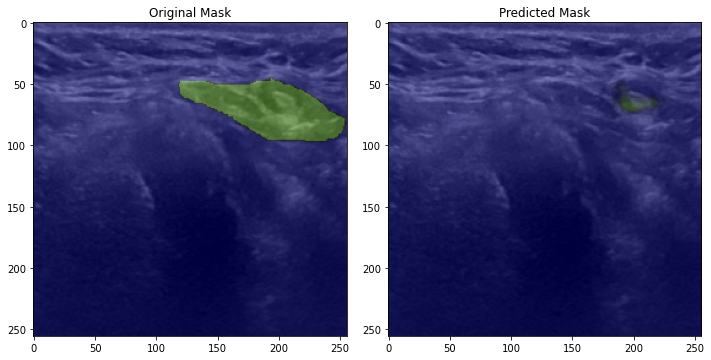

35/35 [==============================] - 6s 168ms/step - loss: 0.0379 - accuracy: 0.9854 - IoU: 0.3337 - val_loss: 0.2387 - val_accuracy: 0.9449 - val_IoU: 0.3337
Epoch 36/50
1/1 [==============================] - 0s 23ms/steploss: 0.0318 - accuracy: 0.9868 - IoU: 0.33


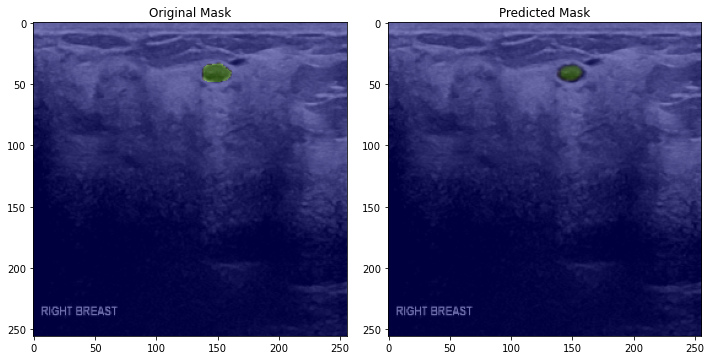

35/35 [==============================] - 6s 167ms/step - loss: 0.0319 - accuracy: 0.9868 - IoU: 0.3337 - val_loss: 0.2023 - val_accuracy: 0.9543 - val_IoU: 0.3337
Epoch 37/50
1/1 [==============================] - 0s 26ms/steploss: 0.0300 - accuracy: 0.9878 - IoU: 0.33


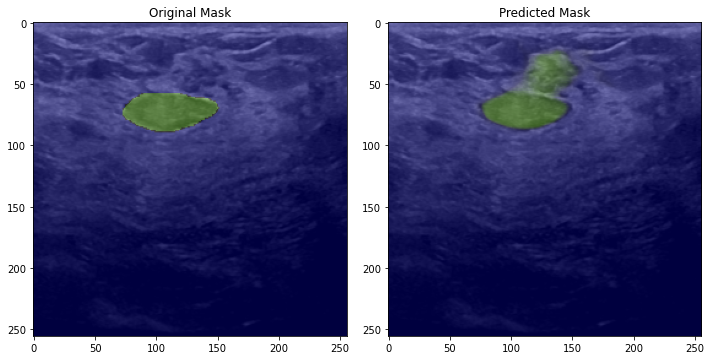

35/35 [==============================] - 7s 192ms/step - loss: 0.0300 - accuracy: 0.9878 - IoU: 0.3337 - val_loss: 0.1721 - val_accuracy: 0.9551 - val_IoU: 0.3337
Epoch 38/50
1/1 [==============================] - 0s 22ms/steploss: 0.0314 - accuracy: 0.9868 - IoU: 0.33


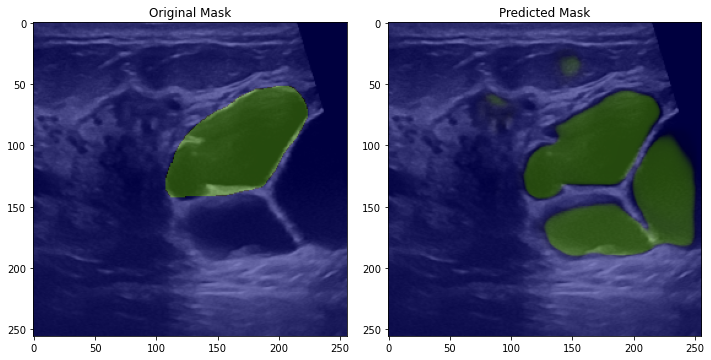

35/35 [==============================] - 6s 170ms/step - loss: 0.0314 - accuracy: 0.9868 - IoU: 0.3337 - val_loss: 0.1872 - val_accuracy: 0.9559 - val_IoU: 0.3337
Epoch 39/50
1/1 [==============================] - 0s 27ms/steploss: 0.0278 - accuracy: 0.9883 - IoU: 0.33


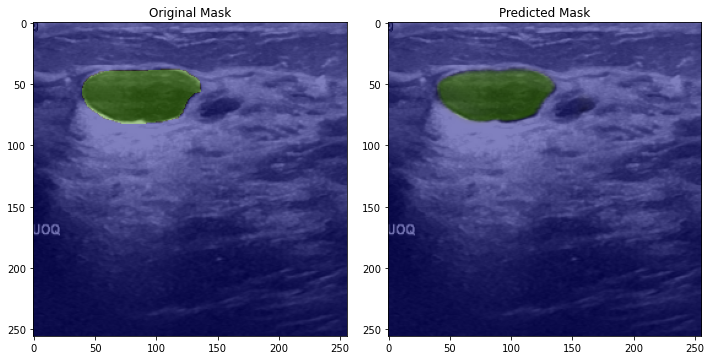

35/35 [==============================] - 6s 180ms/step - loss: 0.0278 - accuracy: 0.9883 - IoU: 0.3337 - val_loss: 0.1634 - val_accuracy: 0.9575 - val_IoU: 0.3337
Epoch 40/50
1/1 [==============================] - 0s 22ms/steploss: 0.0249 - accuracy: 0.9893 - IoU: 0.33


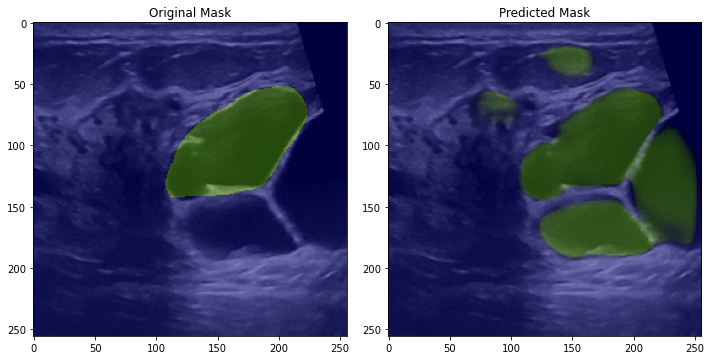

35/35 [==============================] - 6s 159ms/step - loss: 0.0249 - accuracy: 0.9893 - IoU: 0.3337 - val_loss: 0.1877 - val_accuracy: 0.9583 - val_IoU: 0.3337
Epoch 41/50
1/1 [==============================] - 0s 22ms/steploss: 0.0250 - accuracy: 0.9893 - IoU: 0.33


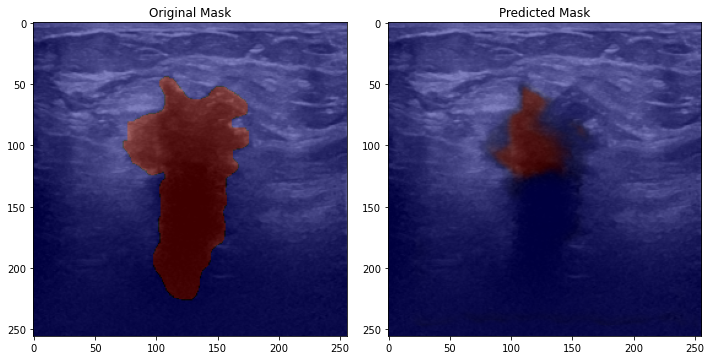

35/35 [==============================] - 6s 168ms/step - loss: 0.0250 - accuracy: 0.9893 - IoU: 0.3337 - val_loss: 0.2281 - val_accuracy: 0.9543 - val_IoU: 0.3337
Epoch 42/50
1/1 [==============================] - 0s 21ms/steploss: 0.0285 - accuracy: 0.9881 - IoU: 0.33


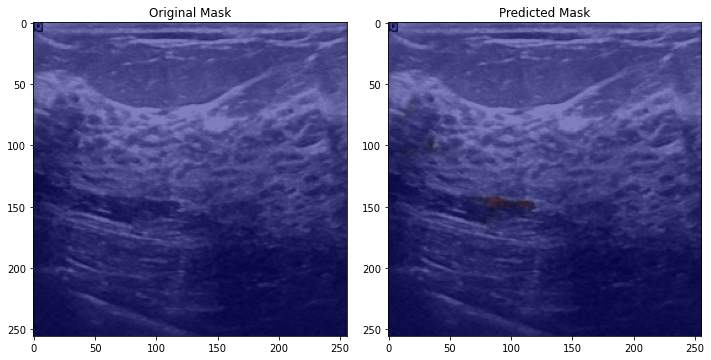

35/35 [==============================] - 6s 169ms/step - loss: 0.0285 - accuracy: 0.9881 - IoU: 0.3337 - val_loss: 0.1817 - val_accuracy: 0.9552 - val_IoU: 0.3337
Epoch 43/50
1/1 [==============================] - 0s 22ms/steploss: 0.0270 - accuracy: 0.9887 - IoU: 0.33


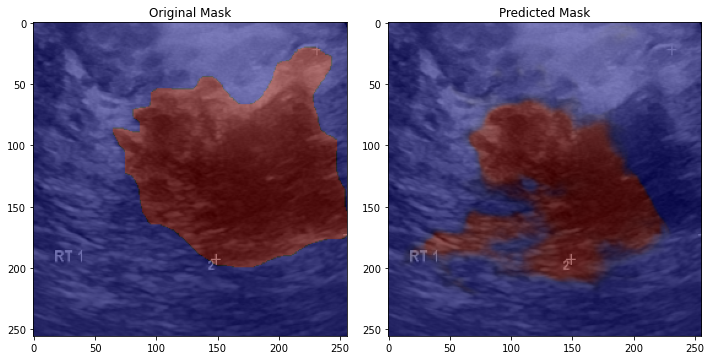

35/35 [==============================] - 6s 180ms/step - loss: 0.0270 - accuracy: 0.9887 - IoU: 0.3337 - val_loss: 0.1872 - val_accuracy: 0.9554 - val_IoU: 0.3337
Epoch 44/50
1/1 [==============================] - 0s 25ms/steploss: 0.0283 - accuracy: 0.9883 - IoU: 0.33


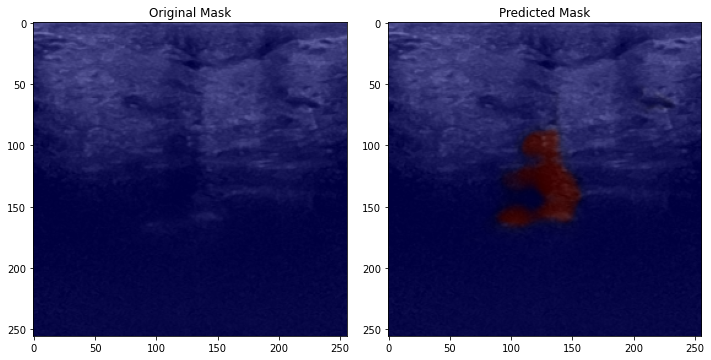

35/35 [==============================] - 6s 160ms/step - loss: 0.0283 - accuracy: 0.9883 - IoU: 0.3337 - val_loss: 0.1895 - val_accuracy: 0.9521 - val_IoU: 0.3337
Epoch 45/50
1/1 [==============================] - 0s 24ms/steploss: 0.0293 - accuracy: 0.9886 - IoU: 0.33


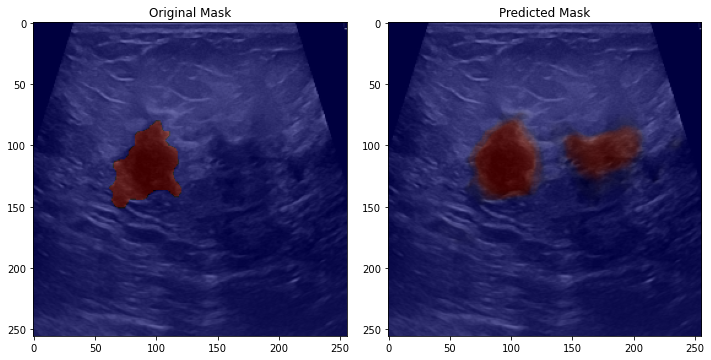

35/35 [==============================] - 6s 168ms/step - loss: 0.0293 - accuracy: 0.9886 - IoU: 0.3337 - val_loss: 0.1758 - val_accuracy: 0.9556 - val_IoU: 0.3337
Epoch 46/50
1/1 [==============================] - 0s 24ms/steploss: 0.0269 - accuracy: 0.9889 - IoU: 0.33


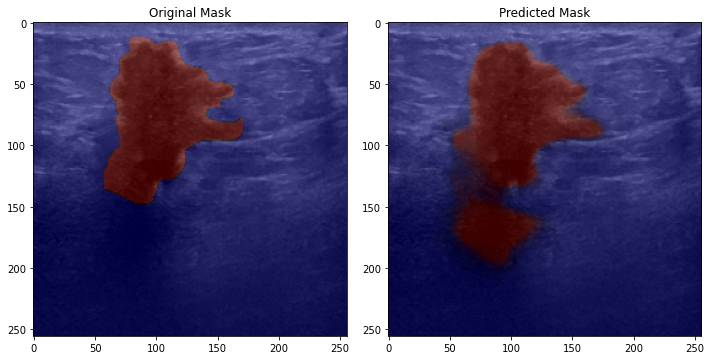

35/35 [==============================] - 6s 169ms/step - loss: 0.0269 - accuracy: 0.9889 - IoU: 0.3337 - val_loss: 0.2085 - val_accuracy: 0.9551 - val_IoU: 0.3337
Epoch 47/50
1/1 [==============================] - 0s 26ms/steploss: 0.0448 - accuracy: 0.9825 - IoU: 0.33


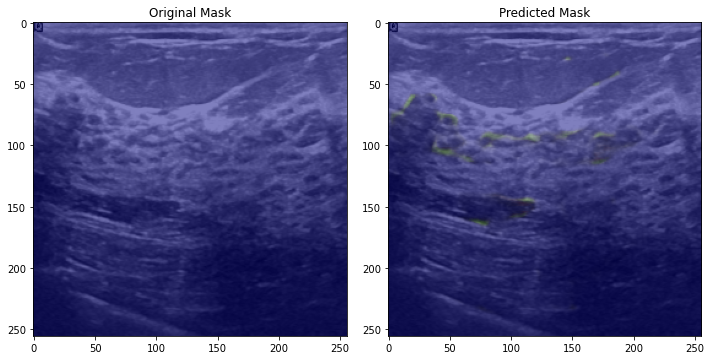

35/35 [==============================] - 6s 159ms/step - loss: 0.0448 - accuracy: 0.9825 - IoU: 0.3337 - val_loss: 0.2817 - val_accuracy: 0.9408 - val_IoU: 0.3357
Epoch 48/50
1/1 [==============================] - 0s 25ms/steploss: 0.0540 - accuracy: 0.9808 - IoU: 0.33


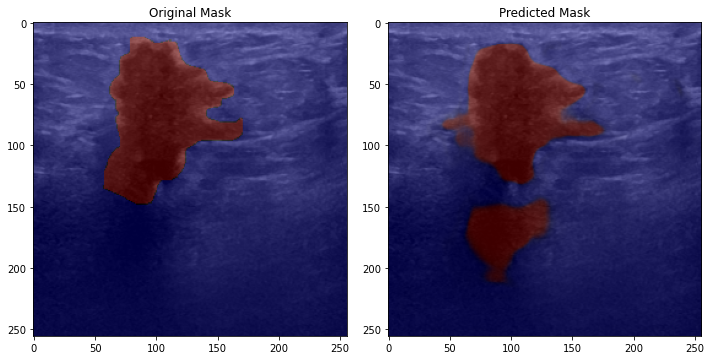

35/35 [==============================] - 6s 163ms/step - loss: 0.0540 - accuracy: 0.9808 - IoU: 0.3337 - val_loss: 0.2202 - val_accuracy: 0.9476 - val_IoU: 0.3337
Epoch 49/50
1/1 [==============================] - 0s 23ms/steploss: 0.0409 - accuracy: 0.9846 - IoU: 0.33


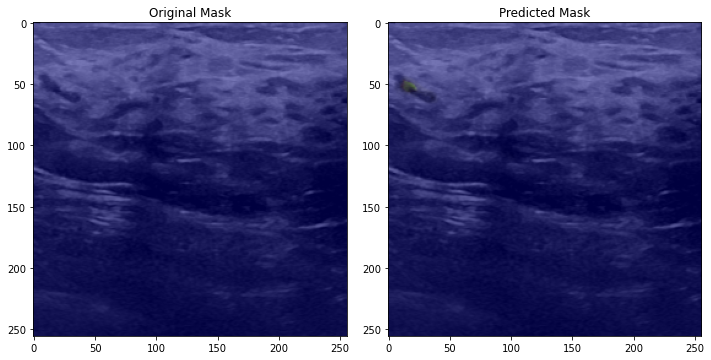

35/35 [==============================] - 6s 159ms/step - loss: 0.0409 - accuracy: 0.9846 - IoU: 0.3337 - val_loss: 0.2043 - val_accuracy: 0.9539 - val_IoU: 0.3337
Epoch 50/50
1/1 [==============================] - 0s 23ms/steploss: 0.0308 - accuracy: 0.9879 - IoU: 0.33


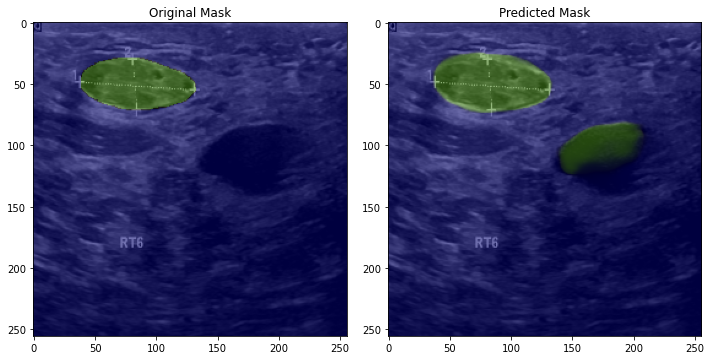

35/35 [==============================] - 6s 161ms/step - loss: 0.0308 - accuracy: 0.9879 - IoU: 0.3337 - val_loss: 0.2205 - val_accuracy: 0.9486 - val_IoU: 0.3337


In [24]:
# Config Training
BATCH_SIZE = 16

# Callbacks
cb = [
    # EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
    ModelCheckpoint("pretrained_Unet.h5", save_best_only=True),
    ShowProgress()
]

# setup sample weights to make class weights work with keras
training_weights = np.take(np.array(class_weights), np.argmax(masks_train, axis=-1))
validation_weights = np.take(np.array(class_weights), np.argmax(masks_val, axis=-1))

# Training
results = model.fit(
    images_train, masks_train,
    validation_data=(images_val, masks_val), #, validation_weights),
    # sample_weight=training_weights,
    epochs=50,
    steps_per_epoch=len(images_train)//BATCH_SIZE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

np.save('pretrained_Unet_hist.npy', results.history)
# history=np.load('my_history.npy',allow_pickle='TRUE').item()

### Plot loss

In [25]:
# history=np.load('pretrained_Unet_hist.npy', allow_pickle='TRUE').item()
# loss, accuracy, iou, val_loss, val_accuracy, val_iou = history.values()

loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()

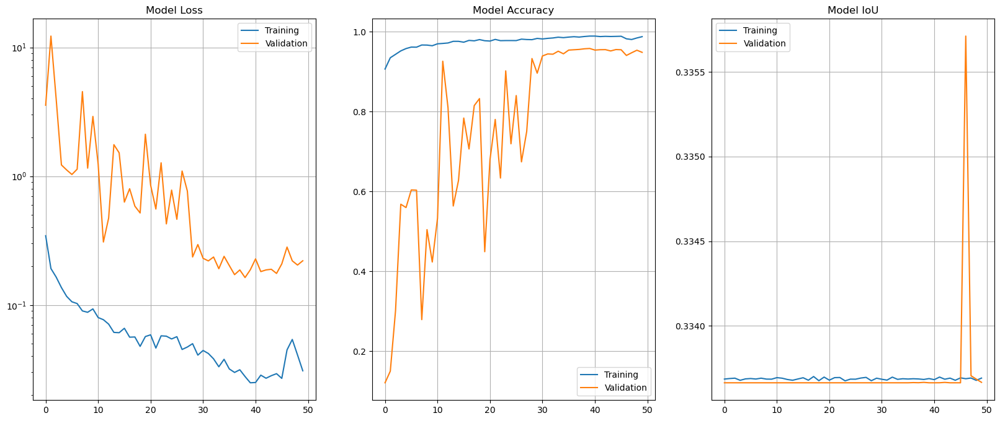

In [26]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validation")
plt.legend()
plt.grid()
plt.yscale('log')

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validation")
plt.legend()
plt.grid()

plt.show()

## Fine-tuning

Epoch 1/30
1/1 [==============================] - 1s 748ms/steposs: 0.0286 - accuracy: 0.9892 - IoU: 0.33


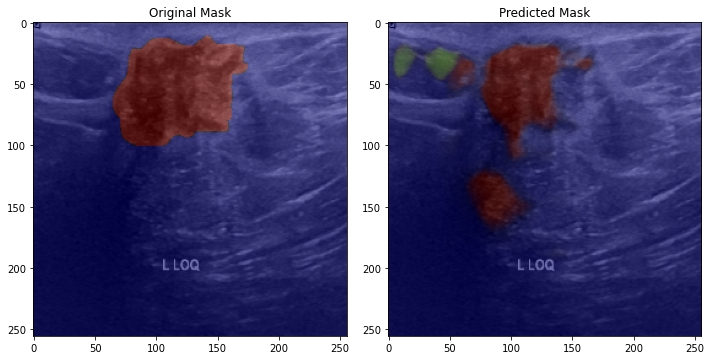

35/35 [==============================] - 34s 263ms/step - loss: 0.0286 - accuracy: 0.9892 - IoU: 0.3337 - val_loss: 0.1952 - val_accuracy: 0.9526 - val_IoU: 0.3337
Epoch 2/30
1/1 [==============================] - 0s 25ms/steploss: 0.0212 - accuracy: 0.9916 - IoU: 0.33


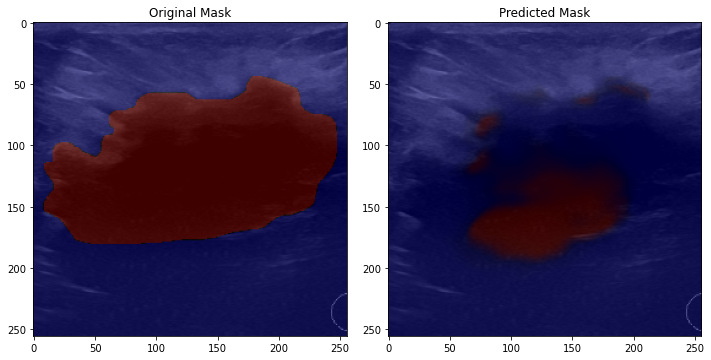

35/35 [==============================] - 7s 214ms/step - loss: 0.0212 - accuracy: 0.9916 - IoU: 0.3337 - val_loss: 0.1866 - val_accuracy: 0.9550 - val_IoU: 0.3337
Epoch 3/30
1/1 [==============================] - 0s 22ms/steploss: 0.0204 - accuracy: 0.9918 - IoU: 0.33


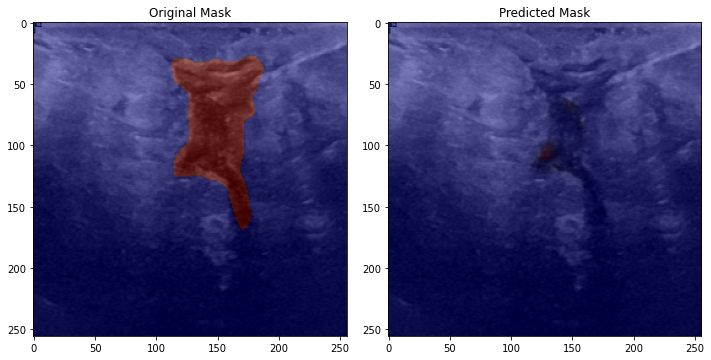

35/35 [==============================] - 7s 188ms/step - loss: 0.0204 - accuracy: 0.9918 - IoU: 0.3337 - val_loss: 0.1882 - val_accuracy: 0.9555 - val_IoU: 0.3337
Epoch 4/30
1/1 [==============================] - 0s 24ms/steploss: 0.0189 - accuracy: 0.9922 - IoU: 0.33


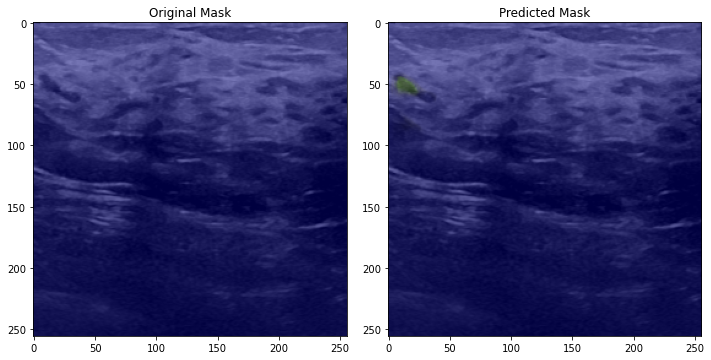

35/35 [==============================] - 8s 218ms/step - loss: 0.0189 - accuracy: 0.9922 - IoU: 0.3337 - val_loss: 0.1839 - val_accuracy: 0.9562 - val_IoU: 0.3337
Epoch 5/30
1/1 [==============================] - 0s 23ms/steploss: 0.0169 - accuracy: 0.9929 - IoU: 0.33


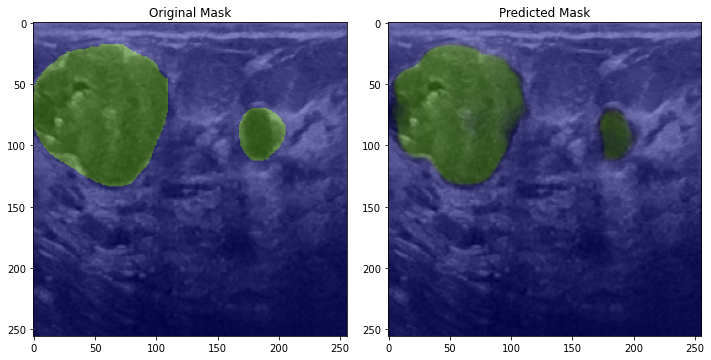

35/35 [==============================] - 6s 178ms/step - loss: 0.0169 - accuracy: 0.9929 - IoU: 0.3337 - val_loss: 0.1891 - val_accuracy: 0.9561 - val_IoU: 0.3337
Epoch 6/30
1/1 [==============================] - 0s 26ms/steploss: 0.0165 - accuracy: 0.9931 - IoU: 0.33


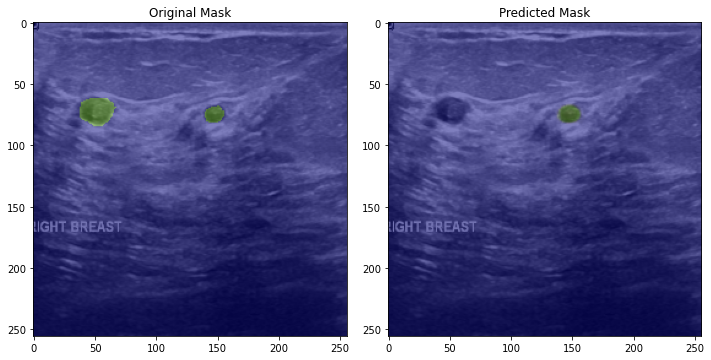

35/35 [==============================] - 6s 177ms/step - loss: 0.0165 - accuracy: 0.9931 - IoU: 0.3337 - val_loss: 0.1905 - val_accuracy: 0.9562 - val_IoU: 0.3337
Epoch 7/30
1/1 [==============================] - 0s 23ms/steploss: 0.0178 - accuracy: 0.9927 - IoU: 0.33


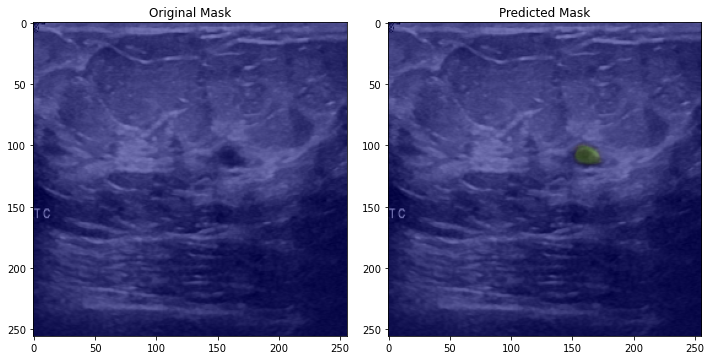

35/35 [==============================] - 6s 185ms/step - loss: 0.0178 - accuracy: 0.9927 - IoU: 0.3337 - val_loss: 0.1858 - val_accuracy: 0.9567 - val_IoU: 0.3337
Epoch 8/30
1/1 [==============================] - 0s 24ms/steploss: 0.0183 - accuracy: 0.9926 - IoU: 0.33


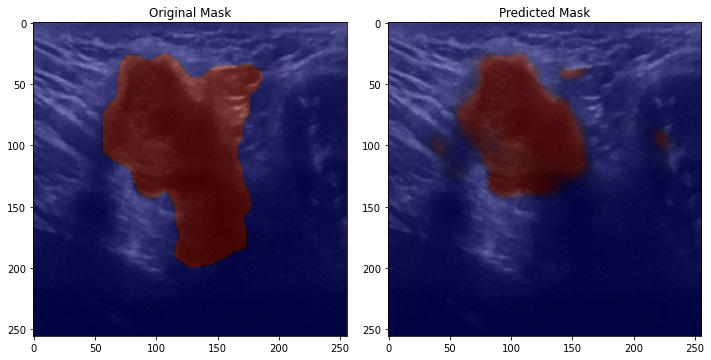

35/35 [==============================] - 6s 179ms/step - loss: 0.0183 - accuracy: 0.9926 - IoU: 0.3337 - val_loss: 0.1872 - val_accuracy: 0.9569 - val_IoU: 0.3337
Epoch 9/30
1/1 [==============================] - 0s 23ms/steploss: 0.0147 - accuracy: 0.9935 - IoU: 0.33


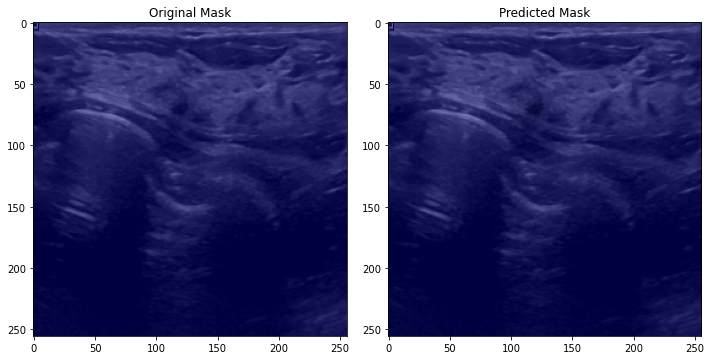

35/35 [==============================] - 6s 185ms/step - loss: 0.0147 - accuracy: 0.9935 - IoU: 0.3337 - val_loss: 0.1872 - val_accuracy: 0.9571 - val_IoU: 0.3337
Epoch 10/30
1/1 [==============================] - 0s 22ms/steploss: 0.0184 - accuracy: 0.9927 - IoU: 0.33


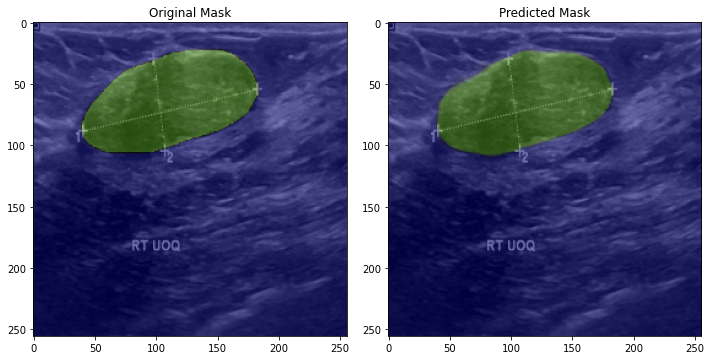

35/35 [==============================] - 6s 185ms/step - loss: 0.0184 - accuracy: 0.9927 - IoU: 0.3337 - val_loss: 0.1937 - val_accuracy: 0.9562 - val_IoU: 0.3337
Epoch 11/30
1/1 [==============================] - 0s 23ms/steploss: 0.0161 - accuracy: 0.9933 - IoU: 0.33


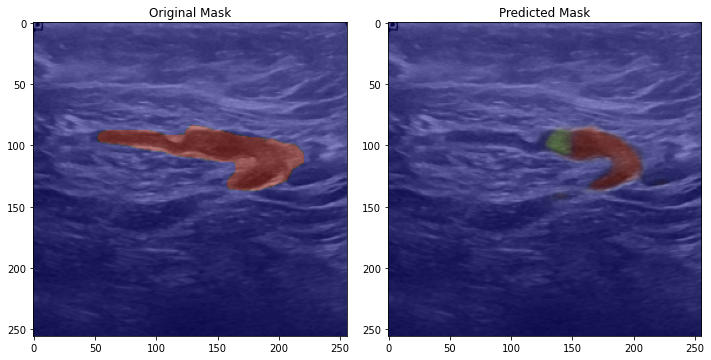

35/35 [==============================] - 6s 178ms/step - loss: 0.0161 - accuracy: 0.9933 - IoU: 0.3337 - val_loss: 0.1871 - val_accuracy: 0.9567 - val_IoU: 0.3337
Epoch 12/30
1/1 [==============================] - 0s 22ms/steploss: 0.0154 - accuracy: 0.9934 - IoU: 0.33


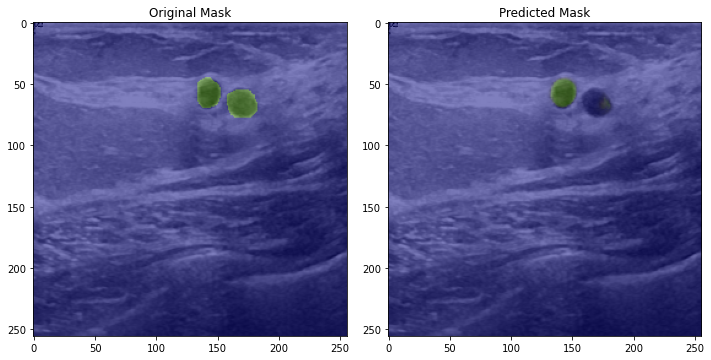

35/35 [==============================] - 6s 186ms/step - loss: 0.0154 - accuracy: 0.9934 - IoU: 0.3337 - val_loss: 0.1876 - val_accuracy: 0.9569 - val_IoU: 0.3337
Epoch 13/30
1/1 [==============================] - 0s 24ms/steploss: 0.0163 - accuracy: 0.9931 - IoU: 0.33


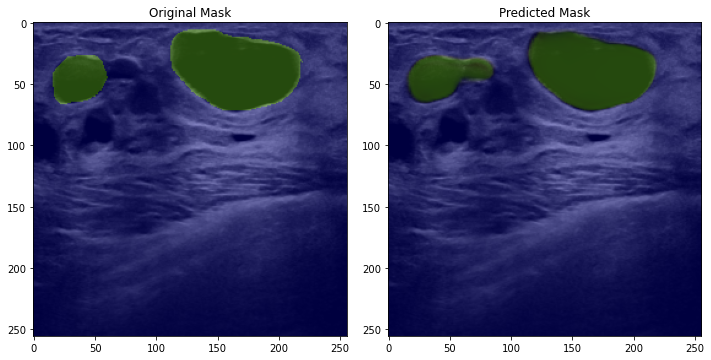

35/35 [==============================] - 6s 179ms/step - loss: 0.0163 - accuracy: 0.9931 - IoU: 0.3337 - val_loss: 0.1859 - val_accuracy: 0.9573 - val_IoU: 0.3337
Epoch 14/30
1/1 [==============================] - 0s 26ms/steploss: 0.0160 - accuracy: 0.9932 - IoU: 0.33


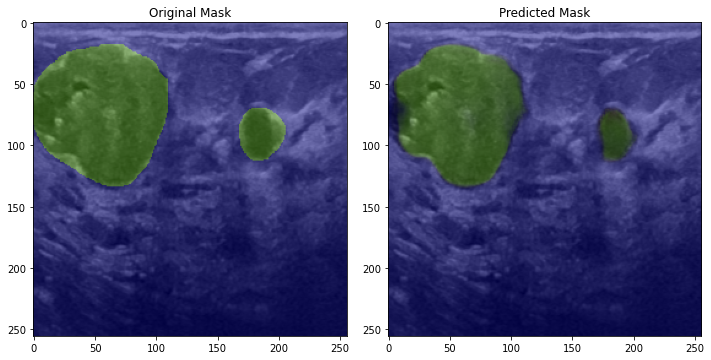

35/35 [==============================] - 6s 186ms/step - loss: 0.0160 - accuracy: 0.9932 - IoU: 0.3337 - val_loss: 0.1842 - val_accuracy: 0.9576 - val_IoU: 0.3337
Epoch 15/30
1/1 [==============================] - 0s 26ms/steploss: 0.0152 - accuracy: 0.9935 - IoU: 0.33


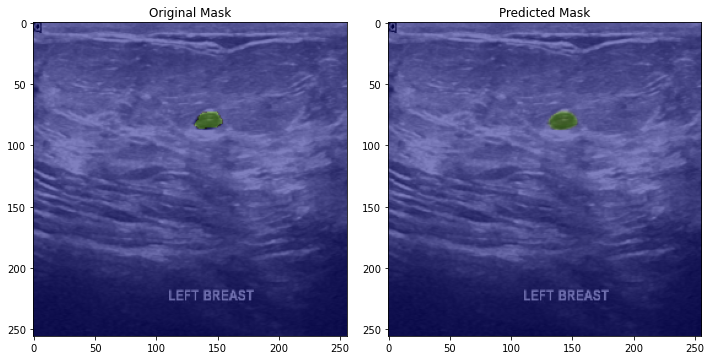

35/35 [==============================] - 7s 210ms/step - loss: 0.0152 - accuracy: 0.9935 - IoU: 0.3337 - val_loss: 0.1792 - val_accuracy: 0.9586 - val_IoU: 0.3337
Epoch 16/30
1/1 [==============================] - 0s 23ms/steploss: 0.0149 - accuracy: 0.9936 - IoU: 0.33


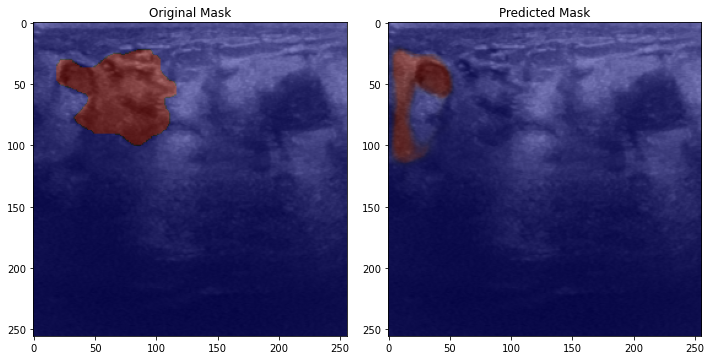

35/35 [==============================] - 7s 209ms/step - loss: 0.0149 - accuracy: 0.9936 - IoU: 0.3337 - val_loss: 0.1784 - val_accuracy: 0.9585 - val_IoU: 0.3337
Epoch 17/30
1/1 [==============================] - 0s 24ms/steploss: 0.0150 - accuracy: 0.9935 - IoU: 0.33


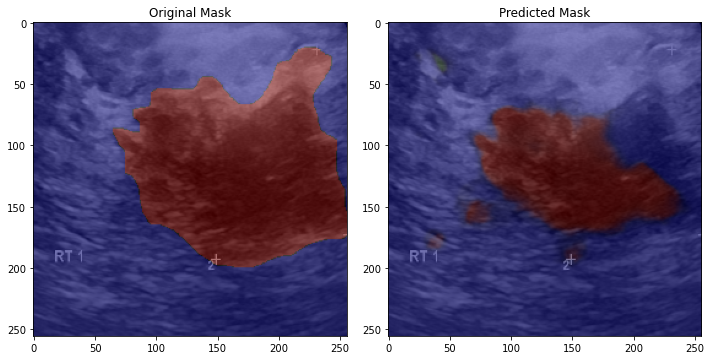

35/35 [==============================] - 7s 188ms/step - loss: 0.0150 - accuracy: 0.9935 - IoU: 0.3337 - val_loss: 0.1797 - val_accuracy: 0.9579 - val_IoU: 0.3337
Epoch 18/30
1/1 [==============================] - 0s 23ms/steploss: 0.0152 - accuracy: 0.9936 - IoU: 0.33


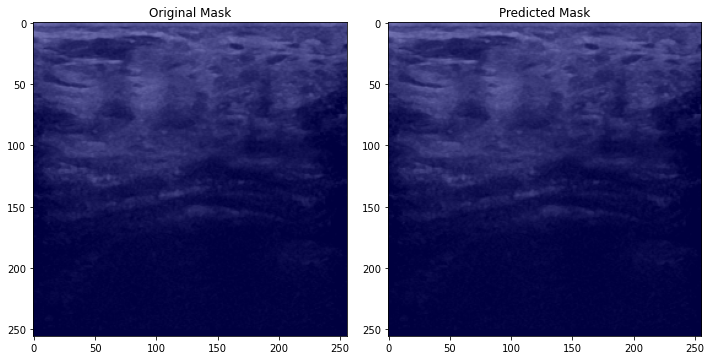

35/35 [==============================] - 6s 180ms/step - loss: 0.0152 - accuracy: 0.9936 - IoU: 0.3337 - val_loss: 0.1811 - val_accuracy: 0.9581 - val_IoU: 0.3337
Epoch 19/30
1/1 [==============================] - 0s 24ms/steploss: 0.0125 - accuracy: 0.9943 - IoU: 0.33


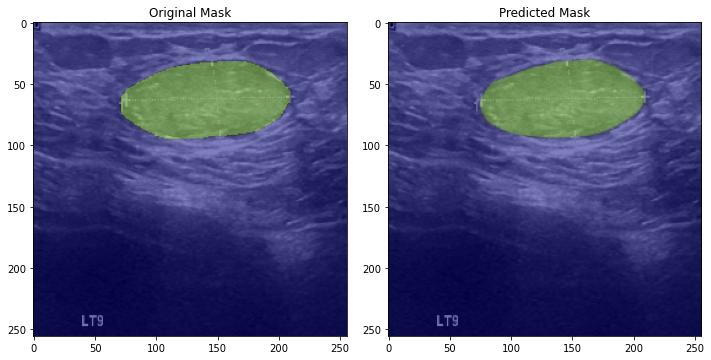

35/35 [==============================] - 8s 220ms/step - loss: 0.0125 - accuracy: 0.9943 - IoU: 0.3337 - val_loss: 0.1763 - val_accuracy: 0.9592 - val_IoU: 0.3337
Epoch 20/30
1/1 [==============================] - 0s 24ms/steploss: 0.0139 - accuracy: 0.9941 - IoU: 0.33


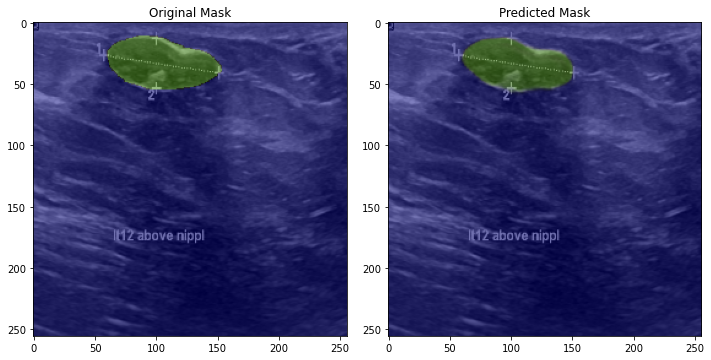

35/35 [==============================] - 7s 190ms/step - loss: 0.0139 - accuracy: 0.9941 - IoU: 0.3337 - val_loss: 0.1805 - val_accuracy: 0.9589 - val_IoU: 0.3337
Epoch 21/30
1/1 [==============================] - 0s 25ms/steploss: 0.0145 - accuracy: 0.9936 - IoU: 0.33


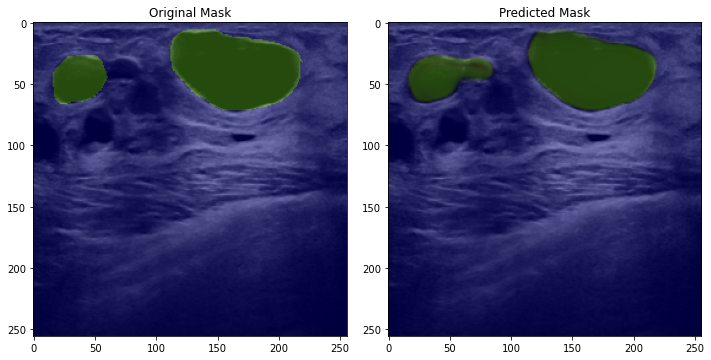

35/35 [==============================] - 6s 177ms/step - loss: 0.0145 - accuracy: 0.9936 - IoU: 0.3337 - val_loss: 0.1840 - val_accuracy: 0.9582 - val_IoU: 0.3337
Epoch 22/30
1/1 [==============================] - 0s 32ms/steploss: 0.0123 - accuracy: 0.9944 - IoU: 0.33


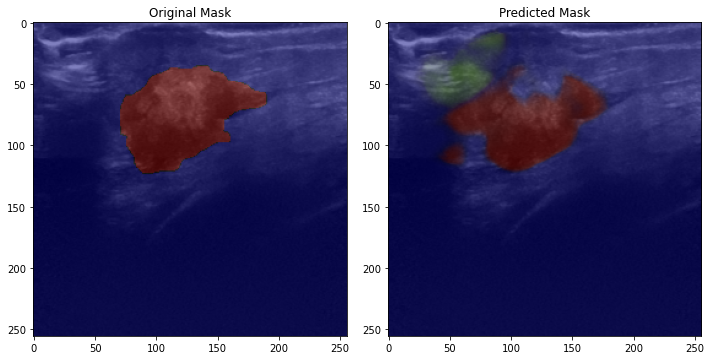

35/35 [==============================] - 6s 185ms/step - loss: 0.0123 - accuracy: 0.9944 - IoU: 0.3337 - val_loss: 0.1863 - val_accuracy: 0.9581 - val_IoU: 0.3337
Epoch 23/30
1/1 [==============================] - 0s 24ms/steploss: 0.0115 - accuracy: 0.9948 - IoU: 0.33


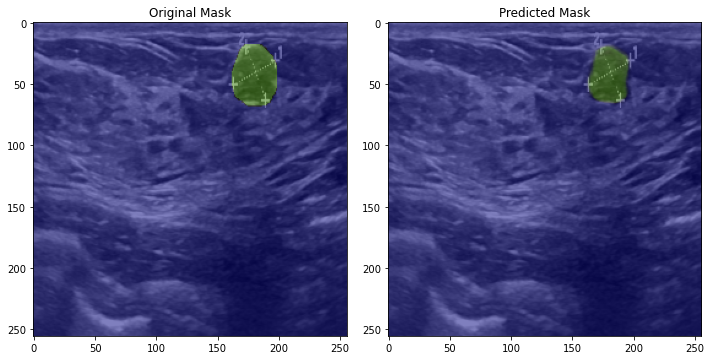

35/35 [==============================] - 6s 186ms/step - loss: 0.0115 - accuracy: 0.9948 - IoU: 0.3337 - val_loss: 0.1859 - val_accuracy: 0.9582 - val_IoU: 0.3337
Epoch 24/30
1/1 [==============================] - 0s 26ms/steploss: 0.0162 - accuracy: 0.9932 - IoU: 0.33


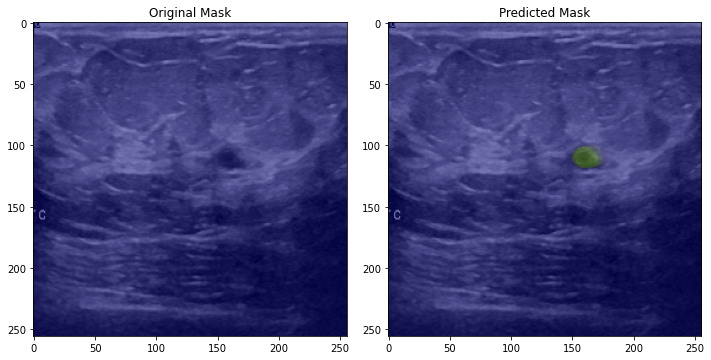

35/35 [==============================] - 6s 185ms/step - loss: 0.0162 - accuracy: 0.9932 - IoU: 0.3337 - val_loss: 0.1794 - val_accuracy: 0.9586 - val_IoU: 0.3337
Epoch 25/30
1/1 [==============================] - 0s 22ms/steploss: 0.0122 - accuracy: 0.9946 - IoU: 0.33


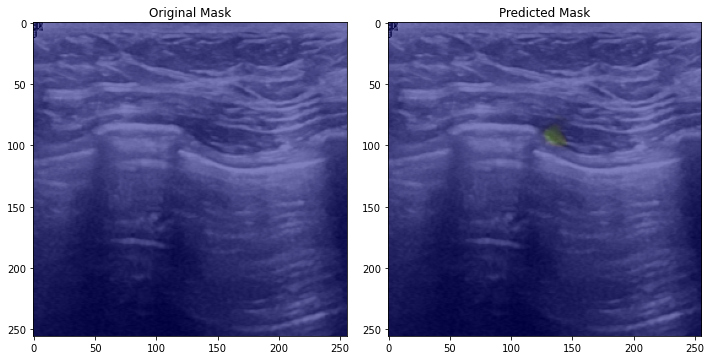

35/35 [==============================] - 7s 191ms/step - loss: 0.0122 - accuracy: 0.9946 - IoU: 0.3337 - val_loss: 0.1815 - val_accuracy: 0.9588 - val_IoU: 0.3337
Epoch 26/30
1/1 [==============================] - 0s 25ms/steploss: 0.0133 - accuracy: 0.9942 - IoU: 0.33


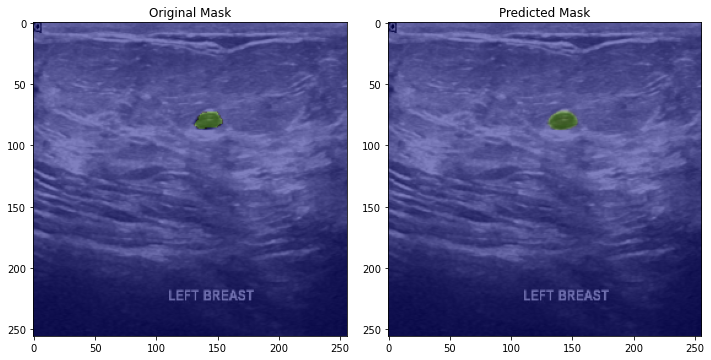

35/35 [==============================] - 6s 179ms/step - loss: 0.0133 - accuracy: 0.9942 - IoU: 0.3337 - val_loss: 0.1788 - val_accuracy: 0.9595 - val_IoU: 0.3337
Epoch 27/30
1/1 [==============================] - 0s 24ms/steploss: 0.0133 - accuracy: 0.9941 - IoU: 0.33


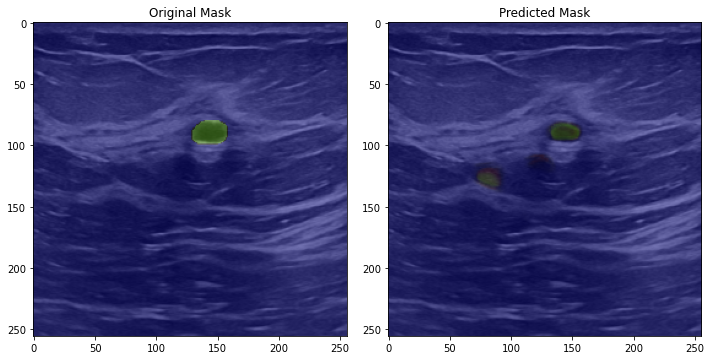

35/35 [==============================] - 6s 180ms/step - loss: 0.0133 - accuracy: 0.9941 - IoU: 0.3337 - val_loss: 0.1846 - val_accuracy: 0.9591 - val_IoU: 0.3337
Epoch 28/30
1/1 [==============================] - 0s 23ms/steploss: 0.0129 - accuracy: 0.9944 - IoU: 0.33


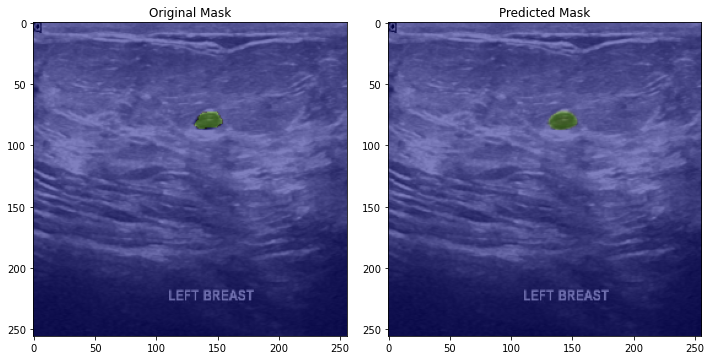

35/35 [==============================] - 6s 177ms/step - loss: 0.0129 - accuracy: 0.9944 - IoU: 0.3337 - val_loss: 0.1858 - val_accuracy: 0.9588 - val_IoU: 0.3337
Epoch 29/30
1/1 [==============================] - 0s 23ms/steploss: 0.0118 - accuracy: 0.9948 - IoU: 0.33


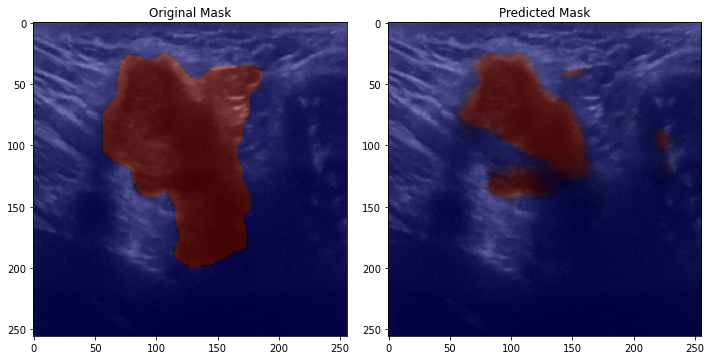

35/35 [==============================] - 6s 178ms/step - loss: 0.0118 - accuracy: 0.9948 - IoU: 0.3337 - val_loss: 0.1890 - val_accuracy: 0.9582 - val_IoU: 0.3337
Epoch 30/30
1/1 [==============================] - 0s 23ms/steploss: 0.0120 - accuracy: 0.9946 - IoU: 0.33


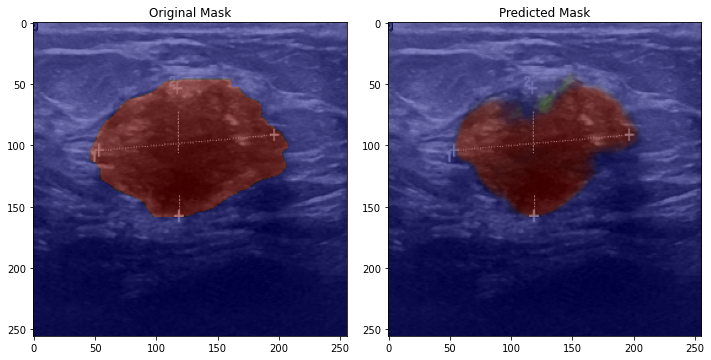

35/35 [==============================] - 6s 178ms/step - loss: 0.0120 - accuracy: 0.9946 - IoU: 0.3337 - val_loss: 0.1824 - val_accuracy: 0.9592 - val_IoU: 0.3337


In [27]:
# make the layers non trainable
for layer in model.layers:
    layer.trainable = True

# Compile with lower learning rate
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    metrics=['accuracy', MeanIoU(num_classes=3, name='IoU')],
)

# Callbacks
cb = [
    # EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
    ModelCheckpoint("pretrained_Unet_ft.h5", save_best_only=True),
    ShowProgress()
]


# Config Training
BATCH_SIZE = 16

# Training
results = model.fit(
    images_train, masks_train,
    validation_data=(images_val, masks_val), #, validation_weights),
    # sample_weight=training_weights,
    epochs=30,
    steps_per_epoch=len(images_train)//BATCH_SIZE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

np.save('pretrained_Unet_ft_hist.npy', results.history)
# history=np.load('my_history.npy',allow_pickle='TRUE').item()

### Plot loss

In [28]:
# history=np.load('pretrained_Unet_hist.npy', allow_pickle='TRUE').item()
# loss, accuracy, iou, val_loss, val_accuracy, val_iou = history.values()

loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()

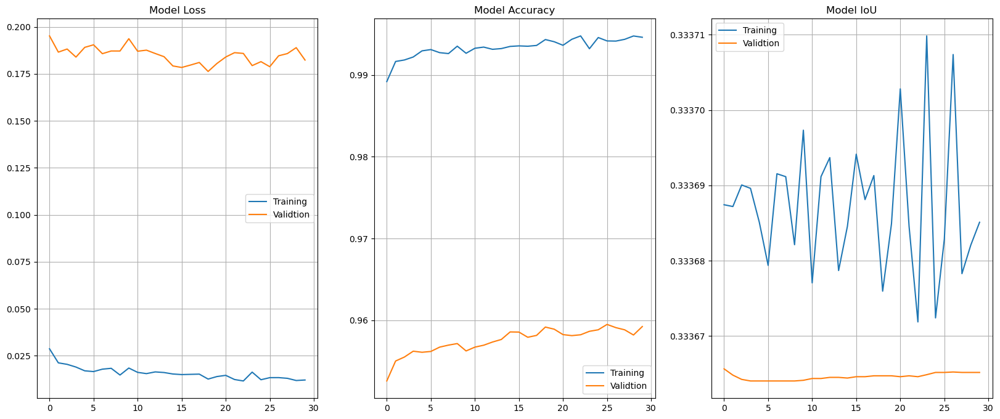

In [29]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

# Evaluation

1/1 [==============================] - 0s 23ms/step


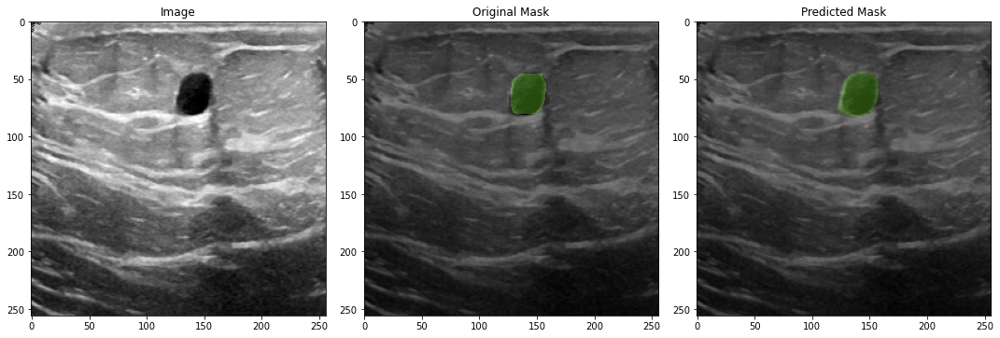

1/1 [==============================] - 0s 26ms/step


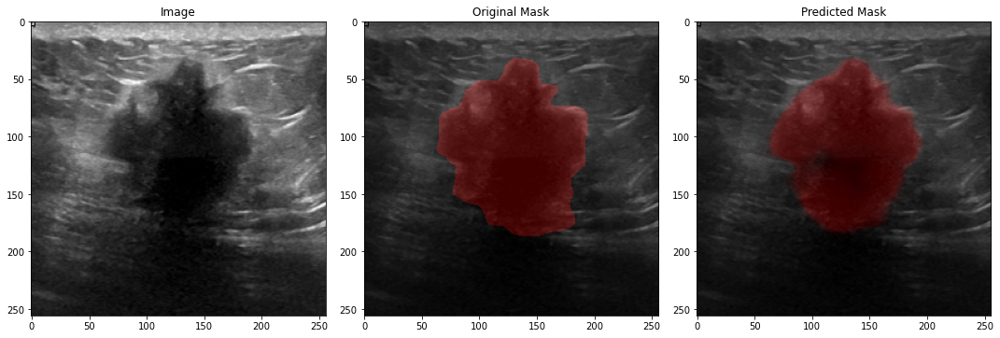

1/1 [==============================] - 0s 23ms/step


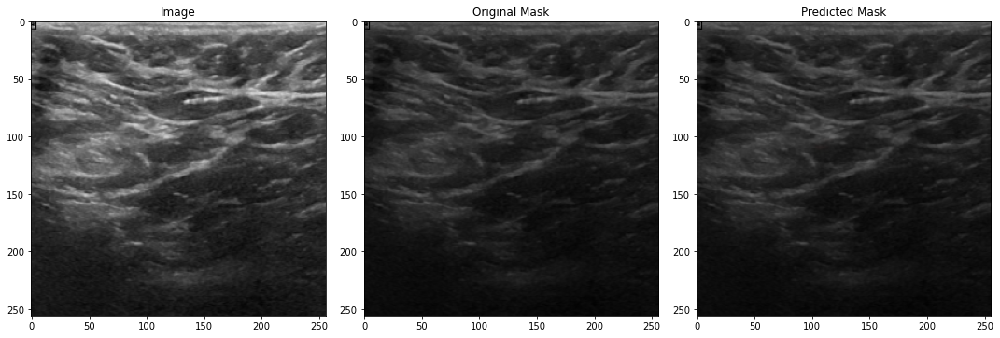

In [30]:
# Luminance-preserving RGB matrix
# inverts R and G so that malignant tumors appear red and benign green
LRGB = np.array([[0.299,  0.587,  0.114],
                 [0.500, -0.419, -0.081],
                 [-0.168, -0.331,  0.500]])


for id in [20, 50, 70]:
    image = images_test[id]
    mask = masks_test[id]
    predicted_mask = model.predict(image[np.newaxis,...])[0]

    # adjust brightness of mask and hide the blue channel
    mask[:,:,2] = 0
    predicted_mask[:,:,2] = 0
    mask = np.einsum("cd, ijc->ijd", LRGB, mask).clip(0, 1)
    predicted_mask = np.einsum("cd, ijc->ijd", LRGB, predicted_mask).clip(0, 1)

    w, h, dpi = 3*360, 360, 72
    fig, axs = plt.subplots(ncols=3, figsize=(w/dpi, h/dpi), dpi=dpi)

    alpha=0.5
    for ax in axs:
        ax.imshow(image)
    axs[0].set_title("Image")

    axs[1].imshow(mask, alpha=alpha)
    axs[1].set_title("Original Mask")

    axs[2].imshow(predicted_mask, alpha=alpha)
    axs[2].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()


## Per-pixel classification

In [31]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

masks_test_pred = model.predict(images_test)
y_true = np.argmax(masks_test, axis=-1).flatten()
y_pred = np.argmax(masks_test_pred, axis=-1).flatten()

cm = confusion_matrix(y_true, y_pred)

4/4 [==============================] - 3s 468ms/step


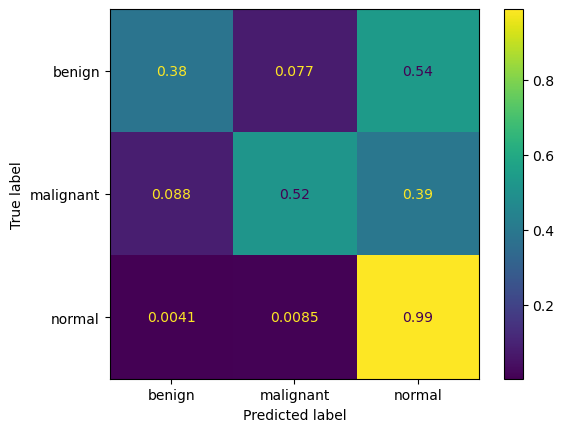

In [32]:
ConfusionMatrixDisplay.from_predictions(y_true, y_pred, display_labels=classes, normalize='true')
plt.show()

In [34]:
precision = precision_score(y_true, y_pred, average='macro', zero_division=0)
recall = recall_score(y_true, y_pred, average='macro', zero_division=0)
f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)
accuracy = accuracy_score(y_true, y_pred)

print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1: {f1}')
print(f'Accuracy: {accuracy}')

Precision: 0.7880622071055704
Recall: 0.6293024523531638
F1: 0.6824971203183307
Accuracy: 0.9201918381911057


## Per-image classification

In [35]:
def get_labels_from_masks(masks, ignore_tumor_threshold=10):
    masks_flat = np.argmax(masks, axis=-1)
    labels = np.zeros(len(masks_flat))

    for i,mask in enumerate(masks_flat):
        num_benign = np.flatnonzero(mask==0).size # count benign pixels
        num_malign = np.flatnonzero(mask==1).size # count malign pixels
        num_normal = mask.size - num_benign - num_malign # count normal pixels
        if num_normal + ignore_tumor_threshold >= mask.size:
            # all is normal
            labels[i] = 2
        elif num_benign > num_malign:
            labels[i] = 0
        else:
            labels[i] = 1
    return labels

In [36]:
labels_test_pred = get_labels_from_masks(masks_test_pred)
labels_test = get_labels_from_masks(masks_test)

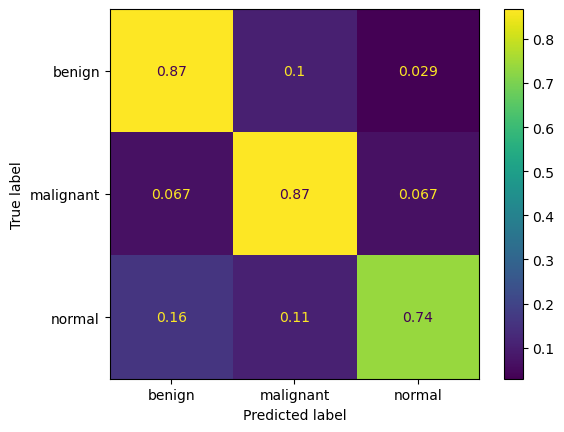

In [37]:
ConfusionMatrixDisplay.from_predictions(labels_test, labels_test_pred, display_labels=classes, normalize='true')
plt.show()

In [38]:
precision = precision_score(labels_test, labels_test_pred, average='macro', zero_division=0)
recall = recall_score(labels_test, labels_test_pred, average='macro', zero_division=0)
f1 = f1_score(labels_test, labels_test_pred, average='macro', zero_division=0)
accuracy = accuracy_score(labels_test, labels_test_pred)

print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1: {f1}')
print(f'Accuracy: {accuracy}')

Precision: 0.8141699735449736
Recall: 0.823718610251118
F1: 0.816898716898717
Accuracy: 0.8461538461538461
